In [3]:
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.path.dirname('__file__'), '/home/kduplat/Documents/Data/Pscript2/Fct_scripts')))
from Tools import *

color_list = ['#0072b2', '#009e73', '#e69f00', '#d55e00','#f0e442',
              '#cc79a7', '#56b4e9', '#000000']

In [4]:
fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]

L1 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[0]
L2 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[1]

#   P(s)

In [4]:
results_s = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                    for  folder in folderpath)

Thisto_s, Tbins_s, Tnonzero_s, Tmean_s,Tnbins_s = zip(*results_s)


In [5]:
Tstart_x = [2,2,2,4,1,0,1,3,5,4,4,8,8,8]
Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]

Txfit_s, Tyfit_s, Ttau_s, Tperr_s = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)
print(Ttau_s)
print(Tperr_s)


0.96545763582405
0.9950241316250408
0.9912114549630819
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362
[-1.22180531 -1.21182967 -1.22687849 -1.22652052 -1.2238533  -1.23840558
 -1.29490603 -1.5691784  -1.75177144 -1.85594949 -1.96543565 -2.11448507
 -2.37162407 -2.64899891]
[0.00288374 0.00931824 0.01948175 0.01829912 0.00759423 0.00672122
 0.00839195 0.01137762 0.00585009 0.00236216 0.00331863 0.00583675
 0.00767259 0.01179889]


/tmp/ipykernel_942194/1822366202.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


/home/kduplat/Documents/py38/lib/python3.8/site-packages/sciplotlib/stylesheets/thesis.mplstyle


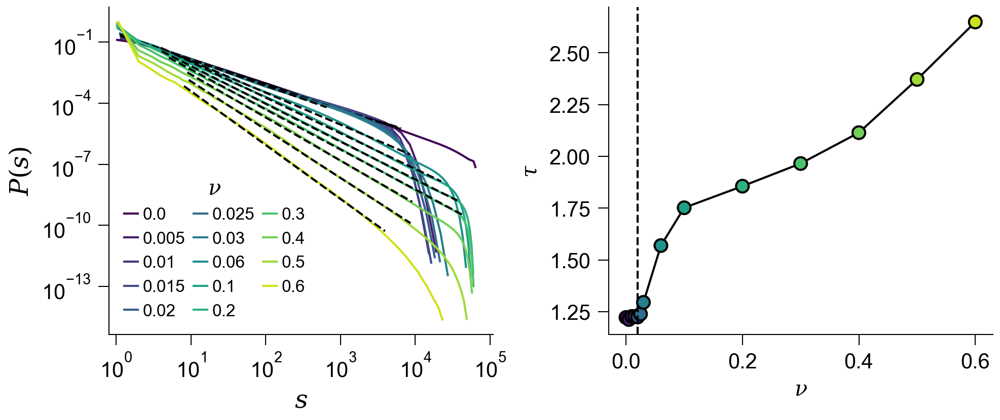

In [15]:

NCURVES = len(Tvar)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

with plt.style.context(spstyle.get_style('thesis')):
    print(spstyle.get_style('thesis'))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (7.5,2.8))
    fig.subplots_adjust(wspace = 0.3)
    for i, (histo,bins, xfit, yfit, tau, nu) in enumerate(zip(Thisto_s,Tbins_s, Txfit_s, Tyfit_s, Ttau_s, Tvar)):
        ax1.plot(bins,histo, color = colors[i], label = nu)
        ax1.plot(xfit, yfit, 'k--',)

    ax2.plot(Tvar, -Ttau_s, linestyle = '-', c = 'k', zorder=1, label = r'$\tau$')
    ax2.scatter(Tvar, -Ttau_s, c = colors[:], marker = 'o', label = r'$\tau$')
    ax2.axvline(0.02, c ='k', ls = '--')
    # ax1.axvline(256 * 256, ls = '--', c = 'k')
    # ax1.axvline((256 * 256)/2, ls = '--', c = 'k')
    # ax1.axvline((256 * 256)/4, ls = '--', c = 'k')
    
    ax1.set_xlim(0.8,1.1e5)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_ylabel(r'$P(s)$')
    ax1.set_xlabel(r'$s$')
    ax1.set_xticks([1, 10, 100, 1000, 10000, 100000])
    ax1.legend(title = r'$\nu$', ncol = 3, handletextpad=0.3, handlelength=0.8, columnspacing=0.5)
    
    # ax2.tick_params(labelsize = 8, length = 2, pad = 1)
    ax2.set_xlabel(r"$\nu$", fontsize = 10)
    ax2.set_ylabel(r"$\tau$", fontsize = 10)
    # ax2.set_xlim(-0.05, 0.7)
    # ax2.set_ylim(1, 3)
    # ax2.set_xticks([0,0.2,0.4,0.6])
    # ax2.errorbar(Tvar, -Ttau_s, yerr = Tperr_s, color = 'k', zorder=2)
    
    plt.savefig("Fig1.pdf", bbox_inches='tight', dpi = 600)
    plt.show()

#   Trace

In [1]:
folderpath = "/data1/DATA_Duplat/Brut/Ava_track/Av9n1"
data = np.loadtxt("{}/prediction_s3.txt".format(folderpath), comments = "#")
i = 766


NameError: name 'np' is not defined

49320248


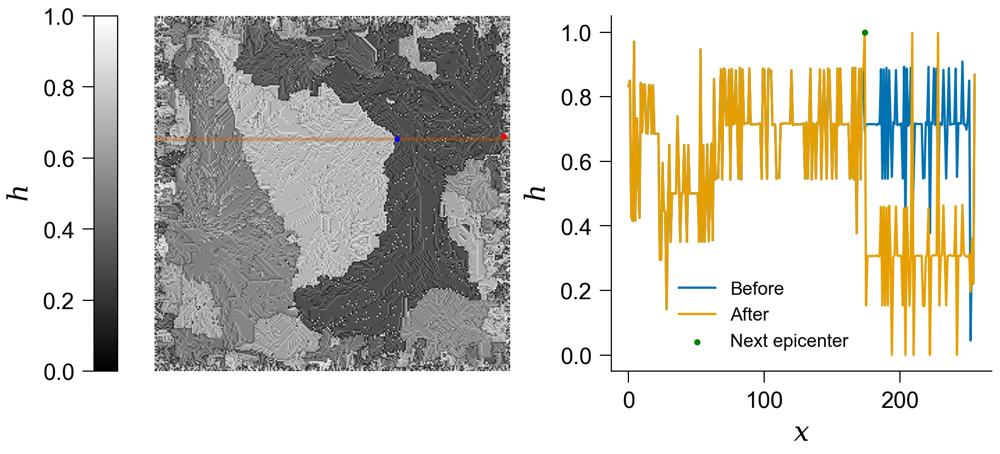

In [56]:
L1 = 256
L2 = 256


nava = int(data[i,0])
sys1 = np.loadtxt("{}/Snapshots/nav{}_before.txt".format(folderpath, nava)).reshape(L1, L2)
sys2 = np.loadtxt("{}/Snapshots/nav{}_outputB.txt".format(folderpath, nava)).reshape(L1, L2)
y_e, x_e = np.unravel_index(int(data[i,2]), (L1, L2))
y_e2, x_e2 = np.unravel_index(int(data[i+1,2]), (L1, L2))
print(nava)

# folderpath = "/data1/DATA_Duplat/Brut/Memory_effects/Me1n4"
# # sys1 = np.loadtxt("{}/Snapshots/nav136033.txt".format(folderpath)).reshape(L1, L2).T
# # sys2 = np.loadtxt("{}/Snapshots/nav136097.txt".format(folderpath)).reshape(L1, L2).T
# # x_e, y_e = np.unravel_index(20470, (L1, L2))

# sys1 = np.loadtxt("{}/Snapshots/nav5703000.txt".format(folderpath)).reshape(L1, L2).T
# sys2 = np.loadtxt("{}/Snapshots/nav5703039.txt".format(folderpath)).reshape(L1, L2).T
# x_e, y_e = np.unravel_index(30237, (L1, L2))

# folderpath = "/data1/DATA_Duplat/Brut/Memory_effects/Me1n1"
# sys3 = np.loadtxt("{}/Snapshots/nav63.txt".format(folderpath)).reshape(L1, L2).T
# sys4 = np.loadtxt("{}/Snapshots/nav68.txt".format(folderpath)).reshape(L1, L2).T



y = [y_e2]*256
x = np.arange(0,256)

from matplotlib.patches import Rectangle
with plt.style.context(spstyle.get_style('thesis')):

    fig, axis = plt.subplots(1,2, figsize = (7.2, 2.8))
    x0, y0, w, h = 0.61, 0.16, 0.24, 0.4

    #rectangle blanc légèrement plus grand
    # fig.add_artist(
    #     Rectangle(
    #         (x0-0.02, y0-0.02),
    #         w+0.04,
    #         h+0.04,
    #         transform=fig.transFigure,
    #         facecolor='white',
    #         edgecolor='none',
    #         zorder=5
    #     )
    # )

    # ax3 = fig.add_axes([x0+0.04, y0+0.1, w-0.03, h-0.1], zorder=10)
    pos = axis[0].imshow(1-sys2, cmap = "gray", vmin = 0, vmax = 1)
    # axis[1].imshow(1-sys2, cmap = "gray", vmin = 0, vmax = 1)
    
    axis[0].scatter(x,y, color = color_list[3], s = 1, alpha = 0.1)
    # axis[1].scatter(x,y, color = color_list[2], s = 2, alpha = 0.1)
    
    axis[0].scatter(x_e,y_e, color = 'r', s = 2, alpha = 1)
    axis[0].scatter(x_e2,y_e2, color = 'b', s = 2, alpha = 1)
    

    axis[0].set_axis_off()
    
    cbar = fig.colorbar(pos, ax=axis, location = 'left', fraction=0.05, aspect = 15, pad = 0.04)
    cbar.set_label(r'$h$')
     
    
    axis[1].plot(1-sys1[y_e2,:], c = color_list[0], label="Before")
    axis[1].plot(1-sys2[y_e2,:], c = color_list[2], label="After")
    axis[1].scatter(x_e2, 1-sys2[y_e2,x_e2], color = 'g',  s = 3, zorder = 10, label = "Next epicenter")
    
    axis[1].set_xlabel(r'$x$')
    axis[1].set_ylabel(r'$h$')
    axis[1].set_ylim(-0.05,1.05)
    axis[1].legend(bbox_to_anchor = (0.4,0.3))
    plt.savefig("traces.pdf", dpi = 600)
    plt.show()
    
   
   
    # fig, (ax1,ax2) = plt.subplots(1,2, figsize = (7.2, 2.8))
    # fig.subplots_adjust(wspace = 0.3)
    
    # # ax1.plot(1-sys3[128,:], c = color_list[0], label="Before")
    # # ax1.plot(1-sys4[128,:], c = color_list[2], label="After")
    
    # ax1.set_xlabel(r'$x$')
    # ax1.set_ylabel(r'$h$')
    # ax1.set_ylim(-0.05,1)
    # ax2.legend()
    
    # ax2.set_xlabel(r'$x$')
    # ax2.set_ylabel(r'$h$')
    # ax2.set_ylim(-0.05,1)
    # plt.savefig("traces_side.pdf", dpi = 600)
    plt.show()

#   P(s)_quantity

In [2]:
data = np.load("/home/kduplat/Documents/Data/Pscript2/Papier_Memory/Figure2.npz", allow_pickle=True)


Tvar = data["Tvar"]
Ttau_s = data["Ttau_s"]
Tbins_s = data["Tbins_s"]
Thisto_s = data["Thisto_s"]
Txfit_s = data["Txfit_s"]
Tyfit_s = data["Tyfit_s"]
Tnonzero_s= data["Tnonzero_s"] 
Tmean_s= data["Tmean_s"]
Tmean_t= data["Tmean_t"]
Tmean_diff= data["Tmean_diff"]

/tmp/ipykernel_942194/2349193254.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


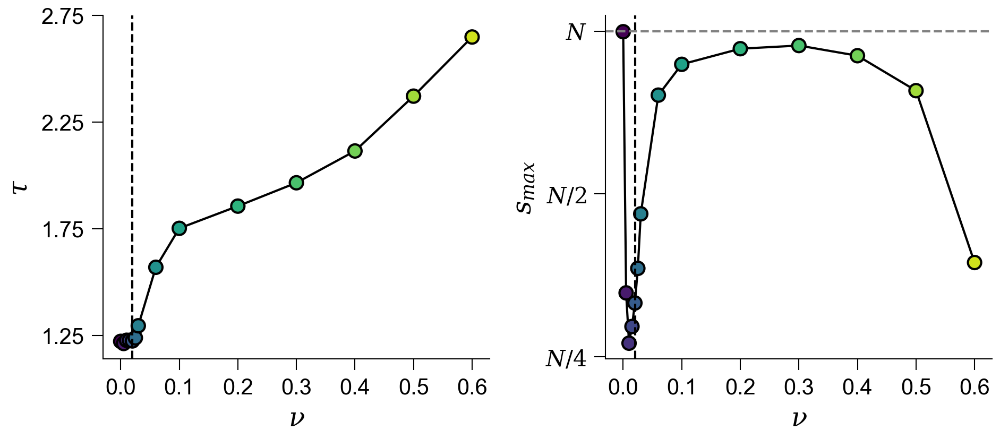

In [ ]:
from matplotlib.ticker import FixedLocator, NullLocator
NCURVES = len(Tvar)
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax4, ax2) = plt.subplots(1,2, figsize=(7.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

    ################## Smax ##################
    ax2.scatter(Tvar, Tnonzero_s, c=colors, marker='o', zorder=2)
    ax2.plot(Tvar, Tnonzero_s, '-', c = 'k', zorder=1)
    ax2.axvline(Tvar[4], ls = '--', c = 'k', label = "{} = {}".format(macros['diss'], Tvar[2]))
    ax2.axhline(L1 * L2, c = "grey", ls = '--')
    ax2.xaxis.set_visible(True)
    ax2.set_xlabel(r'$\nu$')
    ax2.set_ylabel(r'$s_{max}$')
    ax2.set_yscale('log')
    
    N = L1*L2
    yticks = [N, N/2, N/4]
    ax2.yaxis.set_major_locator(FixedLocator(yticks))  # Supprime tous les autres ticks majeurs
    ax2.yaxis.set_minor_locator(NullLocator())  # Supprime les ticks mineurs
    ax2.set_yticklabels([r'$N$', r'$N / 2$', r'$N / 4$'])
    ax2.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])



    ################## Exposant ##################
    ax4.scatter(Tvar, -Ttau_s, c = colors, zorder=2, marker = 'o')
    # ax4.errorbar(Tvar, -Ttau_s, yerr = Tperr_s)
    ax4.plot(Tvar, -Ttau_s, linestyle = '-', c = 'k', zorder=1)
           
    ax4.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]))
    ax4.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    ax4.set_xlabel(r'$\nu$')
    ax4.set_ylabel(r'$\tau$')
    ax4.set_yticks([1.25, 1.75 ,2.25, 2.75])

    


 

    plt.savefig("Fig2_1.pdf",  bbox_inches='tight', dpi = 300)
    plt.show()


/tmp/ipykernel_1162262/4149586994.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


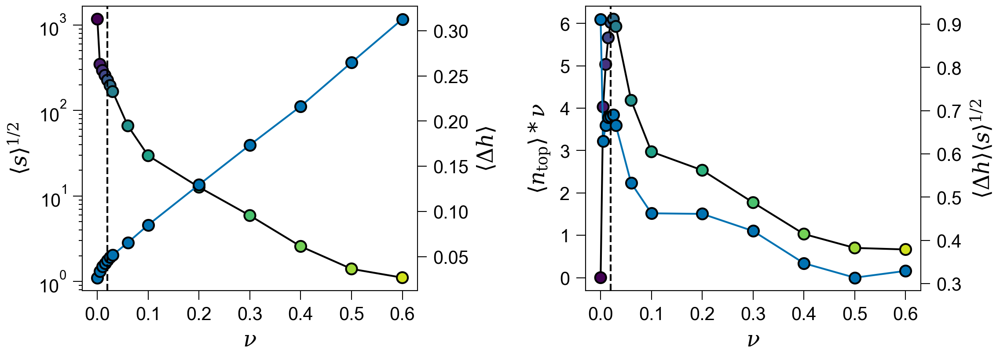

In [3]:
from matplotlib.ticker import FixedLocator, NullLocator
NCURVES = len(Tvar)
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax5, ax3) = plt.subplots(1,2, figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.5)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]



    ################## Avg_dissipated energy ##################
    ax3.scatter(Tvar, Tmean_t * Tvar, c=colors, marker='o', zorder=2)
    ax3.plot(Tvar, Tmean_t * Tvar, c = 'k', zorder = 1)

    ax32 = ax3.twinx()
    ax32.plot(Tvar, Tmean_diff*Tmean_s**(1/2), marker = 'o', c ='#0072b2')
    ax32.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    
    
    # ax33 = fig.add_axes([0.815, 0.29, 0.08, 0.19])
    # ax33.plot(Tvar, Tmean_diff*Tmean_s**(1/2), marker = 'o', c = '#0072b2')
    # ax33.axvline(Tvar[4], linestyle = '--', c = 'k', zorder = 2)
    
    ax3.set_xlabel(r'$\nu$')
    ax3.set_ylabel(r'$\langle n_\mathrm{top} \rangle * \nu$')
    ax32.set_xlabel(r'$\nu$')
    ax32.set_ylabel(r'$ \langle \Delta h\rangle \langle s\rangle^{1/2}$')
    ax32.set_yticks([0.3, 0.4,  0.5, 0.6, 0.7,0.8, 0.9])
    ax3.spines['top'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    ax3.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    # ax32.spines['top'].set_visible(True)
    # ax32.spines['right'].set_visible(True)
    # ax32.set_ylim(-0.02, 0.87)
    
    # ax33.set_xlabel(r'$\nu$', fontsize = 6)
    # ax33.set_ylabel(r'$ \langle \delta z\rangle \langle s\rangle^{1/2}$', fontsize = 6)
    # ax33.set_xlim(-0.01,0.07)
    # ax33.set_ylim(0.48, 0.75)
    
    # ax33.xaxis.labelpad = 1
    # ax33.spines['top'].set_visible(True)
    # ax33.spines['right'].set_visible(True)
    # ax33.tick_params(labelsize = 5, length = 2, pad = 1)

    

    ################## <s> <dz> ##################
    ax5.scatter(Tvar, Tmean_s, c = colors, zorder=2, marker = 'o')
    ax5.plot(Tvar, Tmean_s, c = 'k', zorder=1)

    ax52 = ax5.twinx()
    ax52.plot(Tvar, Tmean_diff, marker = 'o', c = '#0072b2')
    ax52.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    
    # ax53 = fig.add_axes([0.845, 0.57, 0.05, 0.11])
    # ax53.plot(Tvar, Tmean_diff, marker = 'o', c = '#0072b2')
    # ax53.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    
    ax5.set_xlabel(r'$\nu$')
    ax5.set_ylabel(r'$\langle s \rangle^{1/2}$')
    ax5.set_yscale('log')
    ax5.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    
    # ax5.xaxis.set_visible(False)
    ax52.set_xlabel(r'$\nu$')
    ax52.set_ylabel(r'$\langle  \Delta h \rangle$')
    ax52.spines['top'].set_visible(True)
    ax52.spines['right'].set_visible(True)
    ax52.set_yticks([0.05,0.1,0.15,0.2,0.25,0.3])
    
    # ax53.set_xlabel(r'$\nu$')
    # ax53.set_ylabel(r'$\delta \langle  z \rangle$')
    # ax53.set_yscale('log')
    # ax53.set_xlim(-0.01,0.07)
    # ax53.set_ylim(2e-2,1e-1)
    # ax53.yaxis.set_label_coords(-0.2, 0.5) 
    # ax53.xaxis.set_label_coords(0.5, 1.7) 
    # ax53.tick_params(labelsize = 8, length = 2, pad = 1)
    # ax53.yaxis.set_minor_formatter(plt.NullFormatter())
    # ax53.xaxis.set_ticks_position('top')
    # ax53.spines['top'].set_visible(True)
    # ax53.spines['right'].set_visible(True)
    

    plt.savefig("Fig2_2.pdf",  bbox_inches='tight', dpi = 300)
    plt.show()


# FSS

In [30]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu5n{}".format(nb) for nb in [1,11]]
Tnu64 = [read_parameters(folder)[2] for folder in Tfolderpath]

results64 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s64, Tbins_s64, Tnonzero_s64, _, _ = zip(*results64)

In [31]:
Tfolderpath = [f'/data1/DATA_Duplat/Brut/Cut_off_size/Cu4n{nb}' for nb in [1,11]]
Tnu128 = [read_parameters(folder)[2] for folder in Tfolderpath]

results128 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s128, Tbins_s128, Tnonzero_s128, _, _ = zip(*results128)

In [32]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}".format(nb) for nb in [1,11]]
Tnu256 = [read_parameters(folder)[2] for folder in Tfolderpath]

results256 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s256, Tbins_s256,  Tnonzero_s256, _, _ = zip(*results256)

In [33]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu6n1"] + ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu2n{}".format(nb) for nb in [2]]
Tnu512 = [read_parameters(folder)[2] for folder in Tfolderpath]
Tnbins = [50,0,0]

results512 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder), nbins) for (folder, nbins) in zip(Tfolderpath, Tnbins))
Thisto_s512, Tbins_s512, Tnonzero_s512, _, _ = zip(*results512)

In [2]:


with plt.style.context(spstyle.get_style('thesis')):
 
    fig, (ax, ax3) = plt.subplots(1,2, figsize = (7.2,2.8))
    fig.subplots_adjust(wspace = 0.3)
    
    
    mask = [0,10]
    mask2 = [0,2]
    leg1, leg2, leg3 = 0,0,0
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s64, Tbins_s64, np.array(Tnu64))):
        if i == 0:
            leg1 = ax.plot(bins,histo, color = color_list[0], label = '$L = 64$')[0]
        else:
            ax.plot(bins,histo, color = color_list[0])
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s128, Tbins_s128, np.array(Tnu128))):
        if i == 0:
            leg2 = ax.plot(bins,histo, color = color_list[1], label = '$L = 128$')[0]
        else:
            ax.plot(bins,histo, color = color_list[1])
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s256, Tbins_s256, np.array(Tnu256))):
        if i == 0:
            leg3 = ax.plot(bins,histo, color = color_list[2], label = '$L = 256$')[0]
        else:
            ax.plot(bins,histo, color = color_list[2])
    
    
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s512, Tbins_s512, np.array(Tnu512))):
        if i == 0:
            leg4 = ax.plot(bins,histo, color = color_list[3], label = '$L = 512$')[0]
        else:
            ax.plot(bins,histo, color = color_list[3])
    
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r'$s$')
    ax.set_ylabel(r'$P(s)$')
    ax.set_ylim(10**-17, 10)
    ax.set_xticks([1,10,100,1000,10000,100000])
    ax.set_yticks([1e0, 1e-3, 1e-6, 1e-9, 1e-12, 1e-15])
    # ax.legend(handles=[leg1, leg2, leg3, leg4], ncols = 2, loc = "upper right")
    
    S_cut_off_min = np.array([Tnonzero_s64[0], Tnonzero_s128[0], Tnonzero_s256[0], Tnonzero_s512[0]])
    S_cut_off_min2 = np.array([Tnonzero_s64[1], Tnonzero_s128[1], Tnonzero_s256[1], Tnonzero_s512[1]])
    L = np.array([64, 128, 256, 512])
    LL = L*L

    popt, _ = curve_fit(powerlaw2, np.log(LL), np.log( S_cut_off_min))
    a, b = popt
    y_fit = np.exp(powerlaw2(np.log(LL), a, b))

    popt2, _ = curve_fit(powerlaw2, np.log(LL), np.log(S_cut_off_min2))
    a2, b2 = popt2
    y_fit2 = np.exp(powerlaw2(np.log(LL), a2, b2))
    
    # ax2 = fig.add_axes([0.18, 0.205, 0.15, 0.30])
    ax2 = fig.add_axes([0.14, 0.15, 0.16, 0.32])
    line1, = ax2.plot(LL, S_cut_off_min, marker = 'o', ms = 5, lw = 1, c = color_list[0], label = r'$\nu = 0.0$')
    
    line2, = ax2.plot(LL, S_cut_off_min2, marker = 'o', ms = 5, lw = 1, c = color_list[2], label = r'$\nu = 0.3$')
    ax2.plot(LL , 2*y_fit2, ls = '--', c ='k')
    
    ax2.set_xlabel(r'$N$', fontsize = 10)
    ax2.set_ylabel(r'$S_{max}$', fontsize = 10)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.tick_params(labelsize = 8, length = 2, pad = 1) 
    ax2.tick_params(length = 0, which = 'minor')
    ax2.spines['top'].set_visible(True)
    ax2.spines['right'].set_visible(True)
    # ax2.xaxis.labelpad = 4
    ax2.xaxis.tick_top()
    ax2.xaxis.set_label_position('top')
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position('right')
    ax2.set_xlim(2e3, 5e5)
    ax2.set_ylim(2e3, 5e5)
    ax2.patch.set_alpha(0.0)
    
    legbis1 = ax2.legend(handles=[line1], fontsize=8, loc="upper left")
    legbis2 = ax2.legend(handles=[line2], fontsize=8, loc="lower right")
    ax2.add_artist(legbis1)
    # ax2.legend(fontsize = 8, loc = "lower right")

    
    #######RESCALED
    mask = [0,10]
    mask2 = [0,2]
    
    alpha = 2.2
    beta = np.array([2.8, 4.2])

    xscale = (64**-alpha)*(1/(Tbins_s512[0][0]*(512**-alpha)))
    yscale = (64**beta)*(1/(512**beta))
    
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s64, Tbins_s64, np.array(Tnu64))):
        bins = bins * xscale
        histo = histo * yscale[i]
        ax3.plot(bins,histo, color = color_list[0], label = '$L = 64$', lw = 1)[0]
            
    xscale = (128**-alpha)*(1/(Tbins_s512[0][0]*(512**-alpha)))
    yscale = (128**beta)*(1/(512**beta))
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s128, Tbins_s128, np.array(Tnu128))):
        bins = bins * xscale
        histo = histo * yscale[i]
        ax3.plot(bins,histo, color = color_list[1], label = '$L = 128$', lw = 1)[0]

    xscale = (256**-alpha)*(1/(Tbins_s512[0][0]*(512**-alpha)))
    yscale = (256**beta)*(1/(512**beta))
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s256, Tbins_s256, np.array(Tnu256))):
        bins = bins * xscale
        histo = histo * yscale[i]
        ax3.plot(bins,histo, color = color_list[2], label = '$L = 256$', lw = 1)[0]
    
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s512, Tbins_s512, np.array(Tnu512))):
        ax3.plot(bins,histo, color = color_list[3], label = '$L = 512$', lw = 1)[0]
    
    
    ax3.set_xlabel(r'$sL^{-D}$')
    ax3.set_ylabel(r'$P(s)L^{\beta}$')
    ax3.set_xscale('log')
    ax3.set_yscale('log')
    ax3.yaxis.labelpad = 1
    ax3.set_xticks([10**1, 10**5])
    ax3.patch.set_alpha(0.0)
    ax3.set_xticks([1,10,100,1000,10000,100000])
    ax.text(2.e4, 2e-6, r"$\nu = 0.0$", fontsize = 8, color="k", va="bottom")
    ax.text(2.e4, 2e-9, r"$\nu = 0.3$", fontsize = 8, color="k", va="bottom")
    
    ax3.text(2.e4, 2e-6, r"$\nu = 0.0$", fontsize = 8, color="k", va="bottom")
    ax3.text(2.e4, 2e-9, r"$\nu = 0.3$", fontsize = 8, color="k", va="bottom")
    
    ax3.legend(handles=[leg1, leg2, leg3, leg4], ncols = 1, loc = "lower left")
    
    # fig.text(0.08, 0.85, "a", fontsize=7, fontweight="bold") 
    # fig.text(0.5, 0.85, "b", fontsize=7, fontweight="bold")
    
    
    
    
    fig.patch.set_alpha(0.0)
    plt.savefig('Fig3.pdf', bbox_inches='tight', dpi = 300)    
    plt.show()

    

NameError: name 'plt' is not defined

#   Intertime

In [1]:
fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]
NCURVES = len(Tvar)

nbins = 1000
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]

# results_it = Parallel(n_jobs=-1)(delayed(process_time)(folder, nbins + 1)
#                                   for folder in folderpath)

results_it = np.array(Parallel(n_jobs=-1)(delayed(process_time_from_histo)(folder, nbins + 1)
                                  for folder in folderpath))

NameError: name 'np' is not defined

In [7]:
Tstart_x = [1e-6,1e-10,1e-6,1e-10,1e-7,
           1e-10,1e-10,1e-10,1e-10,1e-10,
           1e-10,1e-10,1e-10,1e-10]

Tstop_x = [1e-1,1e-1,1e-1,1e-1,1e-1,
        1e-1,1e-5,1e-5,4e-4,5e-3,
        5e-2,5e-2,5e-2,3e-2]

nb_reduced_bins = 100

Tpdf,Txfit, Tyfit, Tgamma, Tperr =  PDF_it_histogram(results_it, Tstart_x, Tstop_x, nb_reduced_bins)

In [8]:
print(Tperr)

[0.00072253 0.00068126 0.00024419 0.00084357 0.00041032 0.00155749
 0.00466223 0.0023538  0.00163335 0.00115556 0.0014076  0.00096407
 0.00082291 0.00063673]


In [5]:
print(Tgamma)

[-0.00312157 -0.00106011 -0.00378795 -0.00889698 -0.0165135  -0.05355035
 -0.21779267 -0.54502372 -0.69577942 -0.83569384 -0.86334007 -0.9016486
 -0.91786155 -0.91638573]


In [5]:
folder = "/data1/DATA_Duplat/Brut/De_Arcangelis/De1n1"
nbins = 30
minsize = 2
limdata = 1e8
histo_arc, bins_arc = processtime(folder, nbins, minsize, limdata)

In [6]:
sys1 = np.loadtxt("/data1/DATA_Duplat/Brut/PDF/PD5n1/Snapshots/nav100000000_outputB.txt", comments='#').reshape(L1, L2).T
sys2 = np.loadtxt("/data1/DATA_Duplat/Brut/PDF/PD5n5/Snapshots/nav100000000_outputB.txt", comments='#').reshape(L1, L2).T
sys3 = np.loadtxt("/data1/DATA_Duplat/Brut/PDF/PD5n10/Snapshots/nav1000000000_outputB.txt", comments='#').reshape(L1, L2).T
sys4 = np.loadtxt("/data1/DATA_Duplat/Brut/PDF/PD5n14/Snapshots/nav100000000000_outputB.txt", comments='#').reshape(L1, L2).T


/tmp/ipykernel_978482/3758804476.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


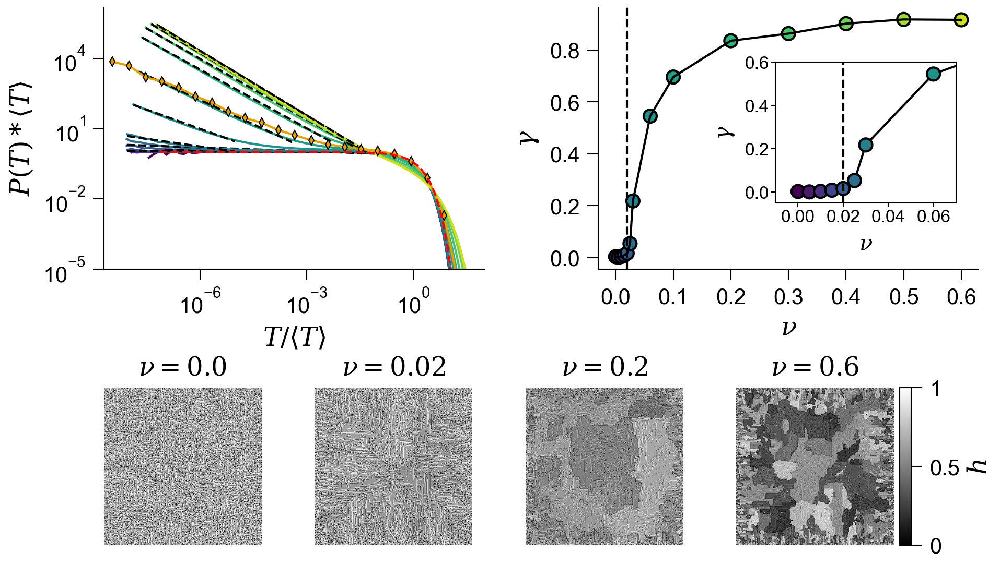

In [ ]:
with plt.style.context(spstyle.get_style('thesis')):

    fig = plt.figure(figsize=(7.2, 5.0))
    gs2 = gridspec.GridSpec(2, 2, hspace=0.3, wspace=0.3)
    gs = gridspec.GridSpec(2, 5, width_ratios=[0.15,0.15,0.15,0.15,0.03], hspace=0.1, wspace=0.4)
    
    NCURVEs = len(Tpdf)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
    
    ax1 = fig.add_subplot(gs2[0, 0])  # La figure 1 prend toute la largeur (2 colonnes)
    for j, (histo, xfit, yfit) in enumerate(zip(Tpdf, Txfit, Tyfit)):
        ax1.plot(histo[:,0], histo[:, 1], color = colors[j])
        ax1.plot(xfit,yfit, 'k--')
        
    ax1.plot(bins_arc, histo_arc, marker ='d', color =color_list[2], markeredgewidth = 0.5, ms = 3)
    poisson = gamma_distribution(histo[:,0], 1, -0.0, 1.)
    ax1.plot(histo[:,0], poisson, linestyle = '--', color = 'red')
    
    ax2 = fig.add_subplot(gs2[0, 1])
    # ax2.plot(Tvar, -Tgamma, linestyle = '-', c = 'k', zorder=1)
    ax2.errorbar(Tvar, -Tgamma, yerr = Tperr, c = 'k')
    ax2.scatter(Tvar, -Tgamma, c = colors[:], zorder=2, marker = 'o')
    ax2.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)

    ax22 = fig.add_axes([0.72, 0.63, 0.16, 0.18])
    ax22.plot(Tvar, -Tgamma, linestyle = '-', c = 'k', zorder=1)
    ax22.scatter(Tvar, -Tgamma, c = colors[:], zorder=2, marker = 'o')
    ax22.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    
    ax31 = fig.add_subplot(gs[1, 0])
    ax31.imshow(sys1, cmap = "binary")
    ax31.set_title(r"$\nu = 0.0$")
    
    ax32 = fig.add_subplot(gs[1, 1])
    ax32.imshow(sys2, cmap = "binary")
    ax32.set_title(r"$\nu = 0.02$")
    
    ax33 = fig.add_subplot(gs[1, 2])
    ax33.imshow(sys3, cmap = "binary")
    ax33.set_title(r"$\nu = 0.2$")
    
    ax34 = fig.add_subplot(gs[1, 3])
    im = ax34.imshow(1-sys4, cmap="gray")
    ax34.set_title(r"$\nu = 0.6$")

    pos = ax34.get_position()
    # Place colorbar to the right of ax34
    cax = fig.add_axes([pos.x1 + 0.005, pos.y0, 0.01, pos.height])  # [x0, y0, width, height]
    cbar = plt.colorbar(im, cax=cax, ticks=[0, 0.5, 1.0])
    cbar.set_label(r'$h$', fontsize = 12)
    cbar.set_ticks([0,0.5,1.0])
    cbar.set_ticklabels(['0', '0.5', '1'])
    
    
    
    ax1.set_xlim(2e-9, 1e2)
    ax1.set_ylim(1e-5, 1.5e6)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel(r'$T/\langle T \rangle$')
    ax1.set_ylabel(r'$P(T) * \langle T \rangle$')
    
    ax2.set_xlabel( r'$\nu$')
    ax2.set_ylabel(r'$\gamma$')
    ax2.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6])
    
    ax22.set_xlim(-0.01,0.07)
    ax22.set_ylim(-0.05,0.6)
    ax22.set_xticks([0,0.02,0.04,0.06])
    ax22.set_xlabel( r'$\nu$', fontsize=10)
    ax22.set_ylabel(r'$\gamma$', fontsize=10)
    ax22.spines['top'].set_visible(True)
    ax22.spines['right'].set_visible(True)
    ax22.tick_params(labelsize = 8, length = 2, pad = 1)
    
    ax31.set_axis_off()
    ax32.set_axis_off()
    ax33.set_axis_off()
    ax34.set_axis_off()
    # fig.text(0.09, 0.85, "a", fontsize=8, fontweight="bold") 
    # fig.text(0.45, 0.85, "b", fontsize=8, fontweight="bold") 
    # fig.text(0.09, 0.4, "c", fontsize=8, fontweight="bold") 
    
    ax22.patch.set_alpha(0.0)
    fig.patch.set_alpha(0.0)

    plt.savefig("Fig4.pdf", bbox_inches='tight', dpi = 600)
    
    plt.show()
    
    
    

## Scaling relation with size

In [18]:
delta = Ttau_s/Tgamma

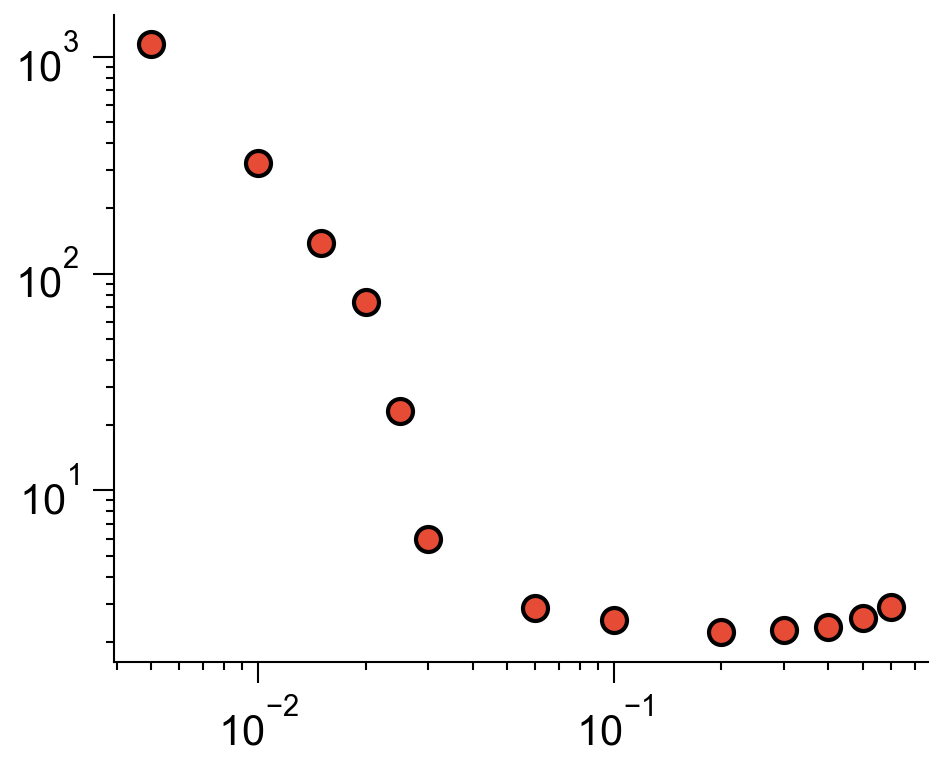

In [20]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(figsize = (3.5,2.8))
    
    ax.scatter(Tvar, delta)
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()

#   CC

In [3]:
def loghisto(linhisto, nbins = 0):
    data = linhisto
    
    last_non_zero = np.nonzero(data)[0]
    nmax = last_non_zero[-1]
    if nbins == 0:
        nbins = freedman_diaconis_log_bins(data[:nmax])
    
    bins, histo = new_logbins(data[:nmax], nbins) #Transforme les bins lin en bins log
    bin_center = (bins[1:] + bins[:-1])/2
    
    mask = histo != 0
    f_histo = histo[mask]
    f_bin_center = bin_center[mask]
    
    return f_histo, f_bin_center

def count_lines_gz_safe(filename, csize = 1000):
    count = 0
    chunk_size = csize 
    try:
        with gzip.open(filename, 'rb') as f:
            leftover = b''
            while True:
                chunk = f.read(chunk_size)
                if not chunk:
                    break
                lines = (leftover + chunk).split(b'\n')
                leftover = lines.pop()  # dernière ligne peut être tronquée
                count += len(lines)
            if leftover:
                count += 1  # compte la dernière ligne même si tronquée
    except EOFError:
        # fichier tronqué, on arrête là et on retourne le compte
        pass
    return count

def process_parallel_load(foldernb, nb = [1,2,3,4,5,6,7,8,9], chunksize = 1e6, L = 64, limdata = 1e6, cols = [12], nbins = 50):

    logbins_s = np.logspace(np.log(1), np.log(L**2), nbins)
    histo_s = np.zeros(len(logbins_s)-1)
    
    logbins_a = np.logspace(np.log(1/L**2), np.log(1), nbins)
    histo_a = np.zeros(len(logbins_a)-1)
    for i in nb:
        file = "/data1/DATA_Duplat/Brut/Memory_effects/Me{}n{}/random_random.gz".format(foldernb,i)
        if chunksize >= 1e5:
            nblines = 0
            
            for chunk in chunked_file_reader(file, chunksize = chunksize, usecols=cols):
                histo_s += np.histogram(chunk.iloc[:, 0], bins = logbins_s)[0]
                histo_a += np.histogram(1/chunk.iloc[:, 0], bins = logbins_a)[0]
                
                nblines += len(chunk)
            
                if nblines >= limdata:
                    break
                
        if chunksize < 1e5:
            with gzip.open(file, "rt") as f:
                for i, line in enumerate(f):
                    if line.startswith("#"):
                        continue
                    
                    s= int(float(line.strip().split()[cols[0]]))

                    id = np.searchsorted(logbins_s, s, side='right') -1
                    histo_s[id] += 1
                    
                    id = np.searchsorted(logbins_a, 1/s, side='left') - 1
                    histo_a[id] += 1
                    
                    if i >= limdata:
                        break
        
            
    # log_histo, log_bins = loghisto(histo_s)
    norm_histo_s = histo_s/((np.diff(logbins_s)) * np.sum(histo_s))
    norm_histo_a = histo_a/((np.diff(logbins_a)) * np.sum(histo_a))
    
    return logbins_s, norm_histo_s, logbins_a, norm_histo_a
    # return log_bins, log_histo, logbins_a, norm_histo_a

def floor_sig(x, n=1): #Pour récupére le floor de la valeur
    p = int(np.floor(np.log10(abs(x))))
    fact = 10 ** (p - n + 1)
    return int(np.floor(x / fact) * fact)

        
def full_analysis(Tfolder_nb, nbins = 50, cols = [12], nbfolder = [1,2,3,4,5,6,7,8,9]): #To sum different realisation in the same project
    Tnbline = [None]*len(Tfolder_nb)
    Tnu = [None]*len(Tfolder_nb)
    TL = [None]*len(Tfolder_nb)
    
    f_log_histo = []
    f_bin_centers_s = []
    f_bin_centers_a = []
    f_norm_histo_a = []

    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        Tnu[j] = read_parameters("{}n1".format(project))[2]
        TL[j] = read_parameters("{}n1".format(project))[0]
        
        min = 1e10
        for i in nbfolder:
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = floor_sig(count_lines_gz_safe(file), 2)
            if nbl < min:
                min = nbl
        print(min)
        Tnbline[j] = min
        
    results = Parallel(n_jobs=-1)(delayed(process_parallel_load)(nb, nbfolder, nbline/10, L, nbline, cols = cols, nbins = nbins)
                                    for (nb, L, nbline) in zip(Tfolder_nb, TL, Tnbline))
    
    for i, (bins_s, histo_s, bins_a, hist_a) in enumerate(results):
        
        bin_centers_s = (bins_s[:-1] + bins_s[1:])/2
        bin_centers_a = (bins_a[:-1] + bins_a[1:])/2
    
        mask = histo_s !=0
        f_bin_centers_s.append(bin_centers_s[mask])
        f_log_histo.append(histo_s[mask])
    
        mask = hist_a!=0
        f_bin_centers_a.append(bin_centers_a[mask])
        f_norm_histo_a.append(hist_a[mask])
    
    return f_bin_centers_s, f_log_histo, f_bin_centers_a,f_norm_histo_a

    






In [4]:
Tfolder_nb = [77,78,79,80,81,83, 82]
Tbin_s1, Thisto_s1, Tbin_a1, Thisto_a1 = full_analysis(Tfolder_nb, nbfolder = [2,3,4,5,6,7,8,9], nbins = 50, cols =[12])

36000
360000
390000
380000
360000
290000
340000


In [5]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/Memory_effects/Me9n{}".format(n) for n in range(1,11)]

nbfolder = len(Tfolderpath)
nbline = 1000
nbcol = 3
data = np.empty((nbfolder,nbline,nbcol))

mask = [8,10,12]
data = [np.loadtxt("{}/random_random.txt".format(folderpath), usecols = mask) for folderpath in Tfolderpath]
data = np.vstack(data)

In [6]:
linhisto_1, linbins_1 = np.histogram(data[:,2], bins = np.arange(1,64*64+1))
linhisto_10, linbins_10 = np.histogram(data[:,1], bins = np.arange(1,64*64+1))
linhisto_100, linbins_100 = np.histogram(data[:,0], bins = np.arange(1,64*64+1))
log_histo_1, log_bins_1 = loghisto(linhisto_1, nbins = 0)
log_histo_10, log_bins_10 = loghisto(linhisto_10, nbins = 0)
log_histo_100, log_bins_100 = loghisto(linhisto_100, nbins = 0)

/tmp/ipykernel_942194/2126705326.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


0.9996666666666667
0.0
0.0
0.0
0.0
0.0
0.9988888888888889
0.998
0.996
0.987
0.9813333333333333
0.9836842105263158


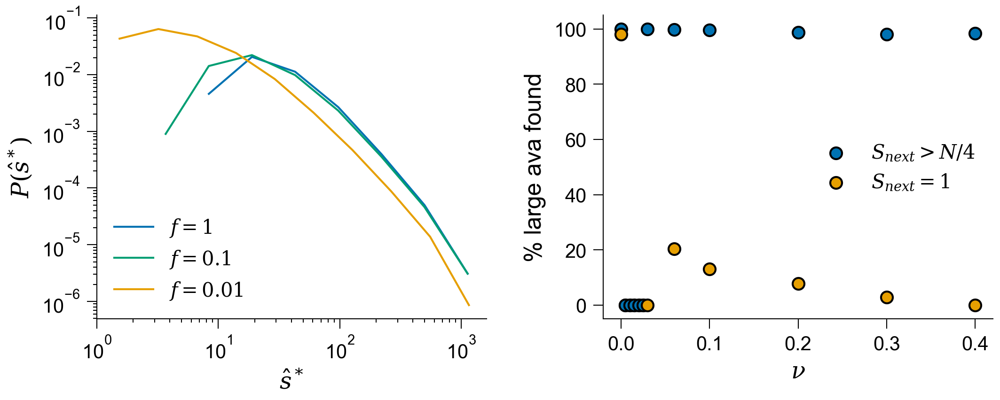

In [8]:
import warnings
from matplotlib.ticker import FixedLocator, NullLocator
from mpl_toolkits.axisartist.axislines import SubplotZero

warnings.resetwarnings()

Tfolderpath = ["/data1/DATA_Duplat/Brut/Memory_effects/Me60n{}".format(nb) for nb in range(1,13)]

Tnu = [0.0, 0.1, 0.2, 0.3 ,0.4, 0.5, 0.6]
Tn_try = [1]*len(Tnu)
Tstop = [1e4, 6e3, 1.2e4, 1e4, 1e4, 5e3, 2e3]
Tstart = [1000, 1e3, 400, 200, 100, 40, 15]
Ttau = [None]*len(Tnu)
NCURVES = len(Tnu)
Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

max_nbtry = 6554

warnings.filterwarnings("error")
with plt.style.context(spstyle.get_style('thesis')):
    
    fig, (ax2, ax1) = plt.subplots(1,2,figsize= (8.2,2.8 ))
    fig.subplots_adjust(wspace = 0.3)
    
    ######NTRY######
    for i, folder in enumerate(Tfolderpath):
        nu = read_parameters(folder)[2]
        small_data = np.loadtxt("{}/random_small.txt".format(folder))
        try:
            large_data = np.loadtxt("{}/random_large.txt".format(folder))
        except UserWarning:
            large_data = np.ones((1,6))
            large_data[0,-1] = max_nbtry
        
        mask_small = small_data[:, -1] != max_nbtry
        mask_large = large_data[:, -1] != max_nbtry
        
        f_small = small_data[mask_small]
        f_large = large_data[mask_large]
        
        p_small = len(f_small)/len(small_data)
        p_large = len(f_large)/len(large_data)
        print(p_large)
        if i == 0:
            ax1.scatter(nu,  p_large*100, c = color_list[0], label = r"$S_{next} > N/4$")
            ax1.scatter(nu,  p_small*100, c = color_list[2], label = r"$S_{next} = 1$" )
            
        else:
            ax1.scatter(nu,  p_small*100, c = color_list[2])
            ax1.scatter(nu,  p_large*100, c = color_list[0])
    
    ax2.plot(log_bins_1, log_histo_1, label = r'$f=1$', c = color_list[0])
    ax2.plot(log_bins_10, log_histo_10, label = r'$f=0.1$', c = color_list[1])
    ax2.plot(log_bins_100, log_histo_100, label = r'$f=0.01$', c = color_list[2])
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlabel(r'$\hat s^*$')
    ax2.set_ylabel(r'$P(\hat s^*)$')
    ax2.set_xticks([1,10,100,1000])
    ax2.legend(fontsize = 10)
    
    
    ax1.set_xlabel(r'$\nu$')
    ax1.set_ylabel('% large ava found')
    ax1.legend(fontsize = 10)
   
    fig.patch.set_alpha(0.0)
    ax1.patch.set_alpha(0.0)
    ax2.patch.set_alpha(0.0)

    plt.savefig("Fig5.pdf", bbox_inches='tight', dpi = 600)
    plt.show() 
    
warnings.resetwarnings()

#   Democratic

In [3]:
fnb = np.arange(1,5)
folderpath = [f'/data1/DATA_Duplat/Brut/Rdtopple/Rd3n{nb}' for nb in fnb]
folderpath = np.array(['/data1/DATA_Duplat/Brut/PDF/PD5n1'] + folderpath)
folderpath = np.insert(folderpath, 2, ['/data1/DATA_Duplat/Brut/Rdtopple/Rd5n1', '/data1/DATA_Duplat/Brut/Rdtopple/Rd4n1'])
Tvar_rt = [read_parameters(folder)[2] for folder in folderpath]
Tvar_rt[4] = 0.06

In [4]:
result = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in folderpath)
Thisto_rt, Tbins_rt, nmax_rt, mean_rt, nbins_rt = zip(*result)

In [5]:
nbins = 1000
folerpath_random = ['/data1/DATA_Duplat/Brut/PDF/PD5n1']+['/data1/DATA_Duplat/Brut/Rdtopple/Rd8n{}'.format(i) for i in [1,2,4,5,6,7]]
Tvar_rt_it = [read_parameters(folder)[2] for folder in folerpath_random]

results_it = np.array(Parallel(n_jobs=-1)(delayed(process_time_from_histo)(folder, nbins + 1)
                                  for folder in folerpath_random))


In [551]:
Tstart_x = [1e-7,1e-6,1e-7,2e-7,1e-7,
           1e-7,1e-7]

Tstop_x = [1e-2,5e-2,5e-3,1e-3,5e-3,
        1e-2,1]

nb_reduced_bins = 50

Tpdf, Txfit, Tyfit, Tgamma, Tperr =  PDF_it_histogram(results_it, Tstart_x, Tstop_x, nb_reduced_bins)

/home/kduplat/Documents/Data/Pscript2/Fct_scripts/Main_fct.py:542: RuntimeWarning: divide by zero encountered in log
  popt, pcov = curve_fit(powerlaw2, np.log(bins[start:stop]), np.log(histo[start:stop]), p0 = [0.5, 1.6], maxfev = 1000)


ValueError: array must not contain infs or NaNs

In [8]:
sys1 = np.loadtxt("/data1/DATA_Duplat/Brut/Rdtopple/Rd3n1/Snapshots/nav100000000_outputB.txt", comments='#').reshape(L1, L2).T
sys2 = np.loadtxt("/data1/DATA_Duplat/Brut/Rdtopple/Rd3n2/Snapshots/nav10000000000_outputB.txt", comments='#').reshape(L1, L2).T
sys3 = np.loadtxt("/data1/DATA_Duplat/Brut/Rdtopple/Rd3n3/Snapshots/nav100000000000_outputB.txt", comments='#').reshape(L1, L2).T

/tmp/ipykernel_387517/3698541168.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_rt = [plt.cm.get_cmap('viridis')(i/NCURVES_rt) for i in range(NCURVES_rt)]


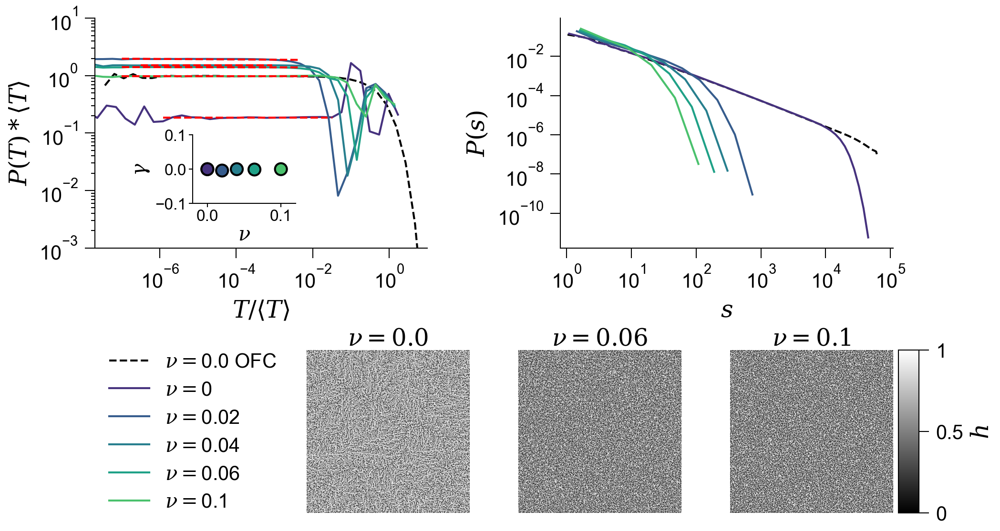

In [27]:
from matplotlib.gridspec import GridSpec
with plt.style.context(spstyle.get_style('thesis')):
    fig = plt.figure(figsize=(7.2, 4.8))
    
    gs1 = GridSpec(2, 2, hspace = 0.3, wspace = 0.4)
    gs2 = GridSpec(2, 4, hspace = 0.3, wspace = 0.3) 

    ax1 = fig.add_subplot(gs1[0, 1])
    ax2 = fig.add_subplot(gs1[0, 0]) 
    ax3 = fig.add_subplot(gs2[1, 1]) 
    ax4 = fig.add_subplot(gs2[1, 2]) 
    ax5 = fig.add_subplot(gs2[1, 3]) 
    
    OFC = Thisto_rt[0]
    
    NCURVES_rt = len(Tvar_rt)
    colors_rt = [plt.cm.get_cmap('viridis')(i/NCURVES_rt) for i in range(NCURVES_rt)]
    
    
    for i, (histo, bins) in enumerate(zip(Thisto_rt[:-1], Tbins_rt[:-1])):
        if i == 0:
            ax1.plot(bins,histo, color = 'k', ls = '--', label = r'$\nu = $' + str(Tvar_rt[i]) + ' OFC')
        else: 
            ax1.plot(bins,histo, color = colors_rt[i], label = r'$\nu = $' + str(Tvar_rt[i]))
            
    for j, (histo, xfit, yfit) in enumerate(zip(Tpdf[:-1], Txfit[:-1], Tyfit[:-1])):
        if j == 0:
            ax2.plot(histo[:,0], histo[:, 1], color = 'k', ls = '--', label = r'$\nu = $' + str(Tvar_rt_it[j]) + ' OFC')
        else:
            ax2.plot(histo[:,0], histo[:, 1], color = colors_rt[j],  label = r'$\nu = $' + str(Tvar_rt_it[j]))
            ax2.plot(xfit, yfit, ls = '--', c = 'r')
            
    ax22 = fig.add_axes([0.22,0.61, 0.1,0.1])
    ax22.scatter(Tvar_rt_it[:-1], Tgamma[:-1], c = colors_rt[:-1])
    
    ax3.imshow(sys1, cmap = "binary")
    ax3.set_title(r"$\nu = 0.0$", pad = 2)
    
    ax4.imshow(sys2, cmap = "binary")
    ax4.set_title(r"$\nu = 0.06$", pad = 2)
    
    im = ax5.imshow( 1-sys3, cmap = "gray")
    ax5.set_title(r"$\nu = 0.1$", pad = 2)
    
    # ax1.axvline(256 * 256, ls = '--', c = 'k')
    ax1.set_xlabel(r'$s$')
    ax1.set_ylabel(r'$P(s)$')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(0.8,1.1e5)
    ax1.set_xticks([1, 1e1, 1e2, 1e3, 1e4, 1e5])
    ax1.set_yticks([1e-2, 1e-4, 1e-6, 1e-8, 1e-10])
    ax1.legend(fontsize = 10, bbox_to_anchor=(-0.8,-0.38))
    
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlabel(r'$T/\langle T \rangle$')
    ax2.set_ylabel(r'$P(T) * \langle T \rangle$')
    ax2.set_ylim(1e-3, 1e1)
    ax2.set_xlim(2e-8, 10)

    ax22.set_ylim(-0.1, 0.1)
    ax22.set_xlim(-0.02, 0.12)
    ax22.set_xlabel(r'$\nu$', fontsize = 10)
    ax22.set_ylabel(r'$\gamma$', fontsize = 10)
    ax22.xaxis.labelpad = 1
    ax22.yaxis.labelpad = 2
    ax22.tick_params(labelsize = 8, pad = 1, length = 2)
    
    ax3.set_axis_off()
    ax4.set_axis_off()
    ax5.set_axis_off()
    
    pos = ax5.get_position()
    # Place colorbar to the right of ax34
    cax = fig.add_axes([pos.x1 + 0.005, pos.y0, 0.02, pos.height])  # [x0, y0, width, height]
    cbar = plt.colorbar(im, cax=cax, ticks=[0, 0.5, 1.0])
    cbar.set_label(r'$h$', fontsize = 12)
    cbar.set_ticks([0,0.5,1.0])
    cbar.set_ticklabels(['0', '0.5', '1'])
    
    # fig.text(0.05, 0.88, "a", fontsize=7, fontweight="bold") 
    # fig.text(0.05, 0.44, "b", fontsize=7, fontweight="bold") 
    # fig.text(0.6, 0.68, "c", fontsize=7, fontweight="bold") 
    
    ax22.patch.set_alpha(0.0)
    fig.patch.set_alpha(0.0)
    # fig.savefig('Ext_data_fig3.pdf', bbox_inches = 'tight', dpi = 300)
    plt.savefig("Fig6.pdf",  bbox_inches = 'tight', dpi = 600)
    plt.show()
    

/tmp/ipykernel_13549/3807908722.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_rt = [plt.cm.get_cmap('viridis')(i/NCURVES_rt) for i in range(NCURVES_rt)]


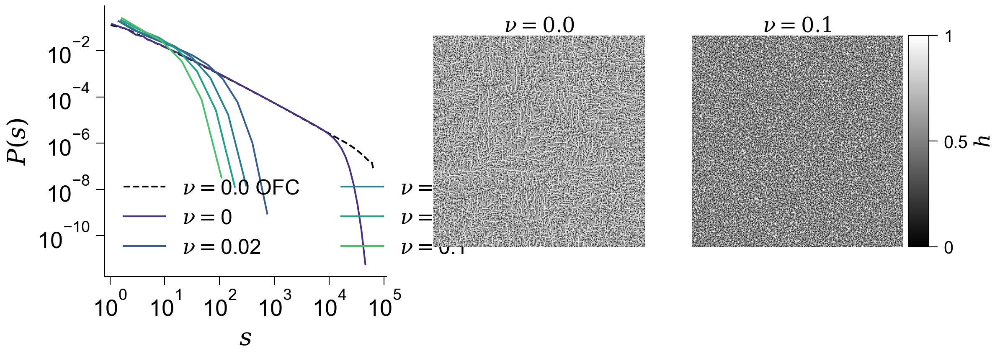

In [41]:
from matplotlib.gridspec import GridSpec
with plt.style.context(spstyle.get_style('thesis')):
    fig = plt.figure(figsize=(8.2, 2.8))
    
    gs1 = GridSpec(1, 3, wspace = 0.2, width_ratios=[0.4, 0.3, 0.3])

    ax1 = fig.add_subplot(gs1[0])
    ax3 = fig.add_subplot(gs1[1]) 
    ax4 = fig.add_subplot(gs1[2]) 
    
    OFC = Thisto_rt[0]
    
    NCURVES_rt = len(Tvar_rt)
    colors_rt = [plt.cm.get_cmap('viridis')(i/NCURVES_rt) for i in range(NCURVES_rt)]
    
    
    for i, (histo, bins) in enumerate(zip(Thisto_rt[:-1], Tbins_rt[:-1])):
        if i == 0:
            ax1.plot(bins,histo, color = 'k', ls = '--', label = r'$\nu = $' + str(Tvar_rt[i]) + ' OFC')
        else: 
            ax1.plot(bins,histo, color = colors_rt[i], label = r'$\nu = $' + str(Tvar_rt[i]))
            

    ax3.imshow(1-sys1, cmap = "gray")
    ax3.set_title(r"$\nu = 0.0$", pad = 2)

    
    im = ax4.imshow(1-sys3, cmap = "gray")
    ax4.set_title(r"$\nu = 0.1$", pad = 2)
    
    # ax1.axvline(256 * 256, ls = '--', c = 'k')
    ax1.set_xlabel(r'$s$', fontsize = 14)
    ax1.set_ylabel(r'$P(s)$', fontsize = 14)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(0.8,1.1e5)
    ax1.set_xticks([1, 1e1, 1e2, 1e3, 1e4, 1e5])
    ax1.set_yticks([1e-2, 1e-4, 1e-6, 1e-8, 1e-10])
    ax1.legend(fontsize = 12, ncol = 2)
    ax1.tick_params(labelsize = 13) 
    # ax22.set_ylim(-0.1, 0.1)
    # ax22.set_xlim(-0.02, 0.12)
    # ax22.set_xlabel(r'$\nu$', fontsize = 10)
    # ax22.set_ylabel(r'$\gamma$', fontsize = 10)
    # ax22.xaxis.labelpad = 1
    # ax22.yaxis.labelpad = 2
    # ax22.tick_params(labelsize = 8, pad = 1, length = 2)
    
    ax3.set_axis_off()
    ax4.set_axis_off()
    
    pos = ax4.get_position()
    # Place colorbar to the right of ax34
    cax = fig.add_axes([pos.x1 + 0.005, pos.y0, 0.02, pos.height])  # [x0, y0, width, height]
    cbar = plt.colorbar(im, cax=cax, ticks=[0, 0.5, 1.0])
    cbar.set_label(r'$h$', fontsize = 12)
    cbar.set_ticks([0,0.5,1.0])
    cbar.set_ticklabels(['0', '0.5', '1'])
    
    # fig.text(0.05, 0.88, "a", fontsize=7, fontweight="bold") 
    # fig.text(0.05, 0.44, "b", fontsize=7, fontweight="bold") 
    # fig.text(0.6, 0.68, "c", fontsize=7, fontweight="bold") 
    
    # ax22.patch.set_alpha(0.0)
    fig.patch.set_alpha(0.0)
    # fig.savefig('Ext_data_fig3.pdf', bbox_inches = 'tight', dpi = 300)
    plt.savefig("Fig6_prev.pdf",  bbox_inches = 'tight', dpi = 600)
    plt.show()
    

#   P(s_c)

In [6]:
def count_lines_gz_safe(filename, csize = 1000):
    count = 0
    chunk_size = csize 
    try:
        with gzip.open(filename, 'rb') as f:
            leftover = b''
            while True:
                chunk = f.read(chunk_size)
                if not chunk:
                    break
                lines = (leftover + chunk).split(b'\n')
                leftover = lines.pop()  # dernière ligne peut être tronquée
                count += len(lines)
            if leftover:
                count += 1  # compte la dernière ligne même si tronquée
    except EOFError:
        # fichier tronqué, on arrête là et on retourne le compte
        pass
    return count

def process_parallel_load(foldernb, nb = [1,2,3,4,5,6,7,8,9], chunksize = 1e6, L = 64, limdata = 1e6, cols = [12], nbins = 50):

    # logbins_s = np.logspace(np.log(1), np.log(L**2), nbins)
    # histo_s = np.zeros(len(logbins_s)-1)
    bins_s = np.arange(0, L**2)
    histo_s = np.zeros(len(bins_s)-1)
    
    logbins_a = np.logspace(np.log(1/L**2), np.log(1), nbins)
    histo_a = np.zeros(len(logbins_a)-1)
    for i in nb:
        file = "/data1/DATA_Duplat/Brut/Memory_effects/Me{}n{}/random_random.gz".format(foldernb,i)
        if chunksize >= 1e5:
            nblines = 0
            
            for chunk in chunked_file_reader(file, chunksize = chunksize, usecols=cols):
                # histo_s += np.histogram(chunk.iloc[:, 0], bins = logbins_s)[0]
                histo_s += np.histogram(chunk.iloc[:, 0], bins = bins_s)[0]
                histo_a += np.histogram(1/chunk.iloc[:, 0], bins = logbins_a)[0]
                
                nblines += len(chunk)
            
                if nblines >= limdata:
                    break
                
        if chunksize < 1e5:
            with gzip.open(file, "rt") as f:
                for i, line in enumerate(f):
                    if line.startswith("#"):
                        continue
                    
                    s= int(float(line.strip().split()[cols[0]]))

                    # id = np.searchsorted(logbins_s, s, side='right') -1
                    # histo_s[id] += 1
                    histo_s[s] +=1
                    
                    id = np.searchsorted(logbins_a, 1/s, side='left') - 1
                    histo_a[id] += 1
                    
                    if i >= limdata:
                        break
        
    logbins_s, loghisto_s = new_logbins(histo_s, nbins)
    
    # log_histo, log_bins = loghisto(histo_s)
    # norm_histo_s = loghisto_s/((np.diff(logbins_s)) * np.sum(loghisto_s))
    norm_histo_a = histo_a/((np.diff(logbins_a)) * np.sum(histo_a))
    
    # return logbins_s, norm_histo_s, logbins_a, norm_histo_a
    return logbins_s, loghisto_s, logbins_a, norm_histo_a

def floor_sig(x, n=1): #Pour récupére le floor de la valeur
    p = int(np.floor(np.log10(abs(x))))
    fact = 10 ** (p - n + 1)
    return int(np.floor(x / fact) * fact)

def count_lines(Tfolder_nb, nbfolder):
    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        min = 1e10
        print(nb)
        for i in range(1,nbfolder+1):
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = count_lines_gz_safe(file)
            print (nbl)
            if nbl < min:
                min = nbl
        print(min)
        
def full_analysis(Tfolder_nb,  nbins = 50, cols = [12], nbfolder = [1,2,3,4,5,6,7,8,9]): #To sum different realisation in the same project
    Tnbline = [None]*len(Tfolder_nb)
    Tnu = [None]*len(Tfolder_nb)
    TL = [None]*len(Tfolder_nb)
    
    f_log_histo = []
    f_bin_centers_s = []
    f_bin_centers_a = []
    f_norm_histo_a = []

    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        Tnu[j] = read_parameters("{}n1".format(project))[2]
        TL[j] = read_parameters("{}n1".format(project))[0]
        
        min = 1e10
        for i in nbfolder:
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = floor_sig(count_lines_gz_safe(file), 2)
            if nbl < min:
                min = nbl
        print(min)
        Tnbline[j] = min
        
    results = Parallel(n_jobs=-1)(delayed(process_parallel_load)(nb, nbfolder, nbline/10, L, nbline, cols = cols, nbins = nbins)
                                    for (nb, L, nbline) in zip(Tfolder_nb, TL, Tnbline))
    
    for i, (bins_s, histo_s, bins_a, hist_a) in enumerate(results):
        
        bin_centers_s = (bins_s[:-1] + bins_s[1:])/2
        bin_centers_a = (bins_a[:-1] + bins_a[1:])/2
    
        mask = histo_s !=0
        f_bin_centers_s.append(bin_centers_s[mask])
        f_log_histo.append(histo_s[mask])
    
        mask = hist_a!=0
        f_bin_centers_a.append(bin_centers_a[mask])
        f_norm_histo_a.append(hist_a[mask])
    
    return f_bin_centers_s, f_log_histo, f_bin_centers_a,f_norm_histo_a
    
def gamma_th():

    fnb = np.arange(1,15)
    folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
    """ folderpath = np.insert(folderpath, 8, '/data1/DATA_Duplat/Brut/PDF/PD8n1') """
    Tvar = [read_parameters(folder)[2] for folder in folderpath]

    results = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                        for  folder in folderpath)
    Thisto_s, Tbins_s, _, _, _ = zip(*results)

    Tstart_x = [2,4,4,4,1,0,1,3,5,4,4,8,8,8]
    Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]
    _, _, Ttau_s, _ = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)
    
    gamma = (-Ttau_s) - (-Ttau_s[0]) - 1
    
    return Tvar, gamma, -Ttau_s
    

def log_exppowlaw(x, a, b, c):
    return np.log(a)-b*np.log(x)-x/c


In [7]:
Tfolder_nb = [77,78,79,80,81,83, 82]
Tbin_s1, Thisto_s1, Tbin_a1, Thisto_a1 = full_analysis(Tfolder_nb, nbfolder = [2,3,4,5,6,7,8,9], nbins = 50, cols =[12])

36000
360000
390000
380000
360000
290000
340000


In [8]:
Tnu_th, Tgamma_th, Ttau_s_th = gamma_th()

0.96545763582405
0.9971726928826957
0.9940950079772213
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362


/tmp/ipykernel_1031912/621327025.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


/home/kduplat/Documents/py38/lib/python3.8/site-packages/sciplotlib/stylesheets/thesis.mplstyle


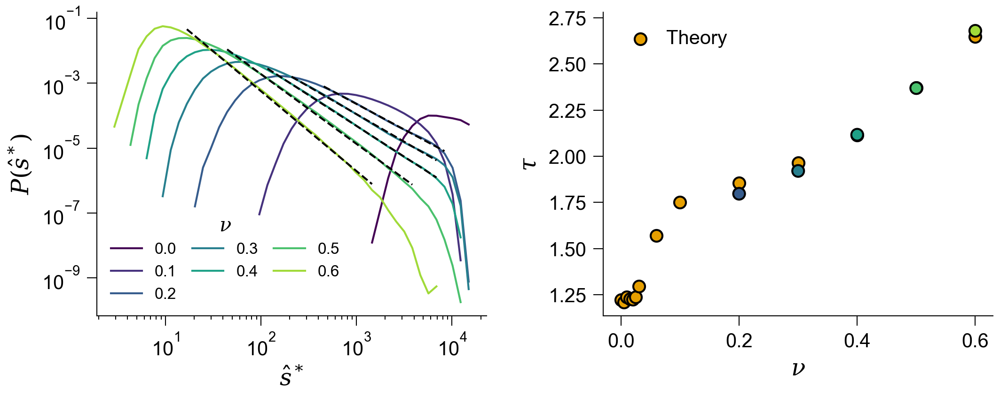

In [9]:
import warnings
from matplotlib.ticker import FixedLocator, NullLocator
from mpl_toolkits.axisartist.axislines import SubplotZero

warnings.resetwarnings()

Tnu = [0.0, 0.1, 0.2, 0.3 ,0.4, 0.5, 0.6]
Tn_try = [1]*len(Tnu)
Tstop = [1e4, 6e3, 1.2e4, 1e4, 1e4, 5e3, 2e3]
Tstart = [1000, 1e3, 400, 200, 100, 40, 15]
Tphi = [None]*len(Tnu)
Tperr = [None]*len(Tnu)
NCURVES = len(Tnu)
Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

max_nbtry = 6554

warnings.filterwarnings("error")
with plt.style.context(spstyle.get_style('thesis')):
    print(spstyle.get_style('thesis'))

    fig, (ax2,ax1) = plt.subplots(1,2,figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    
    
    ######P(smax)######
    for j, n in enumerate(Tnu):
        ax2.plot(Tbin_s1[j], Thisto_s1[j], c = Tcolor[j], label = f"{Tnu[j]}")
        if j not in [0, 1]:
            start = np.where(Tbin_s1[j] >= Tstart[j])[0][0]
            stop = np.where(Tbin_s1[j] <= Tstop[j])[0][-1]
            popt, pcov = curve_fit(powerlaw2, np.log(Tbin_s1[j][start:stop]), np.log(Thisto_s1[j][start:stop]), p0 = [0.5, 1.6], maxfev = 1000)
            Tperr[j] = np.sqrt(np.diag(pcov))[1]
            Tphi[j] = popt[1]
            yfit = np.exp(powerlaw2(np.log(Tbin_s1[j][start:stop]), *popt))
            ax2.plot(Tbin_s1[j][start:stop], yfit, ls = '--', c ='k', lw =1)

    
    # ax1.scatter(Tnu_th, 2-(-Tgamma_th), c = color_list[2], label = r'Theory')
    # ax1.errorbar(Tnu[2:], -np.array(Tphi)[2:], yerr = Tperr[2:], c = 'k', ls = ' ')
    # ax1.scatter(Tnu[2:], -np.array(Tphi)[2:], c = Tcolor[2:], zorder = 2)
    
    ax1.scatter(Tnu_th, Ttau_s_th, c = color_list[2], label = r'Theory')
    ax1.errorbar(Tnu[2:], -np.array(Tphi)[2:]+Ttau_s_th[0]-1, yerr = Tperr[2:], c = 'k', ls = ' ')
    ax1.scatter(Tnu[2:], -np.array(Tphi)[2:]+Ttau_s_th[0]-1, c = Tcolor[2:], zorder = 2)

    ax1.set_ylabel(r"$\tau$")
    ax1.set_xlabel(r"$\nu$")
    ax1.legend(fontsize = 10, handletextpad=0.3)
    
    ax2.set_xlabel(r"$\hat s^*$")
    ax2.set_ylabel(r"$P(\hat s^*)$")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.legend(title = r"$\nu$", ncol = 3, columnspacing=1.0)


    
    fig.patch.set_alpha(0.0)

    ax1.patch.set_alpha(0.0)
    ax2.patch.set_alpha(0.0)
    fig.savefig('Fig8.pdf', bbox_inches = 'tight', dpi = 600)
    plt.show() 
    
warnings.resetwarnings()

In [71]:
print(Tphi)

[None, None, -1.575138433091312, -1.6987526524584418, -1.8948478428775428, -2.1476170778955423, -2.457762883943499]


# Q0

In [10]:
Tproject = ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu5n", "/data1/DATA_Duplat/Brut/Cut_off_size/Cu4n", "/data1/DATA_Duplat/Brut/PDF/PD5n"]
nbfolder = 14
Tnu = [read_parameters("{}{}".format(Tproject[-1], i+1))[2] for i in range(nbfolder)]
size = np.array([64,128, 256])


result = np.zeros((len(size), nbfolder))
for j, project in enumerate(Tproject):
    for i in range(nbfolder):
        data = np.loadtxt("{}{}/time_outputB.txt".format(project, i+1), comments = "#", max_rows = int(1e4))
        dt = data[1,0]-data[0,0]
        dE = np.mean(np.diff(data[:,1]))
        nb_ava_per_E_unit = dt/dE
        result[j, i] = nb_ava_per_E_unit

/tmp/ipykernel_865718/2694800137.py:10: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=10000`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  data = np.loadtxt("{}{}/time_outputB.txt".format(project, i+1), comments = "#", max_rows = int(1e4))


In [7]:
# Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD11n1"]
# results2 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
# Thisto_s2, Tbins_s2, Tnonzero_s2, _, _ = zip(*results2)

folder = "/data1/DATA_Duplat/Brut/PDF/PD11n2"
histo_s4, bins_s4, nonzero_s4, _, _ = new_PDF("{}/stat_histosize.txt".format(folder), nbins = 4) 

data = np.loadtxt("{}/time_outputB.txt".format(folder), comments = "#", max_rows = int(1e4))
dt = data[1,0]- data[0,0]
dE = np.mean(np.diff(data[:,1]))
nb_ava_per_E_unit_s4 = dt/dE

folder = "/data1/DATA_Duplat/Brut/PDF/PD11n3"
histo_s8, bins_s8, nonzero_s8, _, _ = new_PDF("{}/stat_histosize.txt".format(folder), nbins = 8) 

data = np.loadtxt("{}/time_outputB.txt".format(folder), comments = "#", max_rows = int(1e4))
dt = data[1,0]- data[0,0]
dE = np.mean(np.diff(data[:,1]))
nb_ava_per_E_unit_s8 = dt/dE

folder = "/data1/DATA_Duplat/Brut/PDF/PD11n4"
histo_s16, bins_s16, nonzero_s16, _, _ = new_PDF("{}/stat_histosize.txt".format(folder), nbins = 10) 

data = np.loadtxt("{}/time_outputB.txt".format(folder), comments = "#", max_rows = int(1e4))
dt = data[1,0]- data[0,0]
dE = np.mean(np.diff(data[:,1]))
nb_ava_per_E_unit_s16 = dt/dE

folder = "/data1/DATA_Duplat/Brut/PDF/PD11n5"
histo_s32, bins_s32, nonzero_s32, _, _ = new_PDF("{}/stat_histosize.txt".format(folder), nbins = 10) 

data = np.loadtxt("{}/time_outputB.txt".format(folder), comments = "#", max_rows = int(1e4))
dt = data[1,0]- data[0,0]
dE = np.mean(np.diff(data[:,1]))
nb_ava_per_E_unit_s32 = dt/dE



/tmp/ipykernel_865718/120101357.py:8: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=10000`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  data = np.loadtxt("{}/time_outputB.txt".format(folder), comments = "#", max_rows = int(1e4))
/tmp/ipykernel_865718/120101357.py:16: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=10000`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If

In [8]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu5n{}".format(nb) for nb in [1]]
Tnu64 = [read_parameters(folder)[2] for folder in Tfolderpath]

results64 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s64, Tbins_s64, Tnonzero_s64, _, _ = zip(*results64)

Tfolderpath = [f'/data1/DATA_Duplat/Brut/Cut_off_size/Cu4n{nb}' for nb in [1]]
Tnu128 = [read_parameters(folder)[2] for folder in Tfolderpath]

results128 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s128, Tbins_s128, Tnonzero_s128, _, _ = zip(*results128)

Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}".format(nb) for nb in [1]]
Tnu256 = [read_parameters(folder)[2] for folder in Tfolderpath]

results256 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder)) for folder in Tfolderpath)
Thisto_s256, Tbins_s256,  Tnonzero_s256, _, _ = zip(*results256)

Tfolderpath = ["/data1/DATA_Duplat/Brut/Cut_off_size/Cu6n1"]
Tnu512 = [read_parameters(folder)[2] for folder in Tfolderpath]
Tnbins = [50,0,0]

results512 = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder), nbins) for (folder, nbins) in zip(Tfolderpath, Tnbins))
Thisto_s512, Tbins_s512, Tnonzero_s512, _, _ = zip(*results512)

data = np.loadtxt("/data1/DATA_Duplat/Brut/Cut_off_size/Cu6n1/time_outputB.txt")
dt = data[1,0]-data[0,0]
dE = np.mean(np.diff(data[:,1]))
nb_ava_per_E_unit_512 = dt/dE

/tmp/ipykernel_865718/2974143100.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


[-1.12111684 -1.31018111 -1.21371381 -1.213167   -1.21211657 -1.21298243
 -1.22987682 -1.22527746]
1.8631150480909122 0.758332184845643


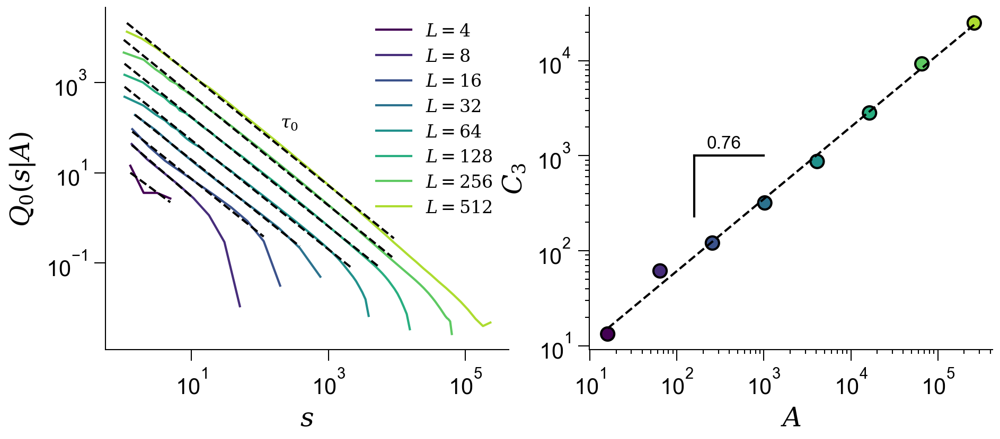

In [ ]:
tau_Q = np.zeros(4)
const_Q = np.zeros(4)

NCURVES = 8
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

with plt.style.context(spstyle.get_style('thesis')):

    fig, (ax, ax2) = plt.subplots(1,2,figsize = (7.2,2.8))
    fig.subplots_adjust(wspace = 0.3)
    
   
   
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s64, Tbins_s64, np.array(Tnu64))):
        if i == 0:
            leg1 = ax.plot(bins,histo*result[0,0], c = colors[4], label = '$L = 64$')[0]
            s_max = np.argwhere(bins > int(2.5e3))[0,0]
            popt, pcov = curve_fit(powerlaw2, np.log(bins[3:s_max]), np.log(histo[3:s_max]*result[0,0]), p0 = [0.5, 1.6], maxfev = 1000)
            tau_Q[0]= popt[1]
            const_Q[0] = np.exp(popt[0])

            yfit = np.exp(powerlaw2(np.log(bins[:s_max]), *popt))
            ax.plot(bins[:s_max], yfit, c = 'k', ls = '--')
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s128, Tbins_s128, np.array(Tnu128))):
        if i == 0:
            leg2 = ax.plot(bins,histo*result[1,0], c = colors[5], label = '$L = 128$')[0]
            s_max = np.argwhere(bins > int(6e3))[0,0]
            popt, pcov = curve_fit(powerlaw2, np.log(bins[2:s_max]), np.log(histo[2:s_max]*result[1,0]), p0 = [0.5, 1.6], maxfev = 1000)
            tau_Q[1]= popt[1]
            const_Q[1] = np.exp(popt[0])
            yfit = np.exp(powerlaw2(np.log(bins[:s_max]), *popt))
            ax.plot(bins[:s_max], yfit, c = 'k', ls = '--')

    for i, (histo, bins, nu) in enumerate(zip(Thisto_s256, Tbins_s256, np.array(Tnu256))):
        if i == 0:
            leg3 = ax.plot(bins,histo*result[2,0], c = colors[6], label = '$L = 256$')[0]
            s_max = np.argwhere(bins > int(9e3))[0,0]
            popt, pcov = curve_fit(powerlaw2, np.log(bins[:s_max]), np.log(histo[:s_max]*result[2,0]), p0 = [0.5, 1.6], maxfev = 1000)
            tau_Q[2]= popt[1]
            const_Q[2] = np.exp(popt[0])
            yfit = np.exp(powerlaw2(np.log(bins[:s_max]), *popt))
            ax.plot(bins[:s_max], yfit, c = 'k', ls = '--')
            
    for i, (histo, bins, nu) in enumerate(zip(Thisto_s512, Tbins_s512, np.array(Tnu512))):
        if i == 0:

            leg4 = ax.plot(bins,histo*nb_ava_per_E_unit_512, c = colors[7], label = '$L = 512$')[0]
            s_max = np.argwhere(bins > int(1e4))[0,0]
            popt, pcov = curve_fit(powerlaw2, np.log(bins[:s_max]), np.log(histo[:s_max]*nb_ava_per_E_unit_512), p0 = [0.5, 1.6], maxfev = 1000)
            tau_Q[3]= popt[1]
            const_Q[3] = np.exp(popt[0])
            yfit = np.exp(powerlaw2(np.log(bins[:s_max]), *popt))
            ax.plot(bins[:s_max], yfit, c = 'k', ls = '--')
            
            
            
    leg5 = ax.plot(bins_s4,histo_s4*nb_ava_per_E_unit_s4, c = colors[0], label = '$L = 4$')[0]
    popt, pcov = curve_fit(powerlaw2, np.log(bins_s4[:]), np.log(histo_s4[:]*nb_ava_per_E_unit_s4), p0 = [0.5, 1.6], maxfev = 1000)
    tau_Q = np.insert(tau_Q, 0, popt[1])
    const_Q = np.insert(const_Q, 0, np.exp(popt[0]))
    yfit = np.exp(powerlaw2(np.log(bins_s4[:]), *popt))
    ax.plot(bins_s4[:], yfit, c = 'k', ls = '--')
    
    
    leg6 = ax.plot(bins_s8,histo_s8*nb_ava_per_E_unit_s8, c = colors[1], label = '$L = 8$')[0]
    s_max = np.argwhere(bins_s8 > 10)[1,0]
    popt, pcov = curve_fit(powerlaw2, np.log(bins_s8[:s_max]), np.log(histo_s8[:s_max]*nb_ava_per_E_unit_s8), p0 = [0.5, 1.6], maxfev = 1000)
    tau_Q = np.insert(tau_Q, 1, popt[1])
    const_Q = np.insert(const_Q, 1, np.exp(popt[0]))
    yfit = np.exp(powerlaw2(np.log(bins_s8[:s_max]), *popt))
    ax.plot(bins_s8[:s_max], yfit, c = 'k', ls = '--')
    
    
    leg7 = ax.plot(bins_s16,histo_s16*nb_ava_per_E_unit_s16, c = colors[2], label = '$L = 16$')[0]
    s_max = np.argwhere(bins_s16 > 80)[1,0]
    popt, pcov = curve_fit(powerlaw2, np.log(bins_s16[:s_max]), np.log(histo_s16[:s_max]*nb_ava_per_E_unit_s16), p0 = [0.5, 1.6], maxfev = 1000)
    tau_Q = np.insert(tau_Q, 2, popt[1])
    const_Q = np.insert(const_Q, 2, np.exp(popt[0]))
    yfit = np.exp(powerlaw2(np.log(bins_s16[:s_max]), *popt))
    ax.plot(bins_s16[:s_max], yfit, c = 'k', ls = '--')
    
    leg8 = ax.plot(bins_s32,histo_s32*nb_ava_per_E_unit_s32, c = colors[3], label = '$L = 32$')[0]
    s_max = np.argwhere(bins_s32 > 700)[0,0]
    popt, pcov = curve_fit(powerlaw2, np.log(bins_s32[:s_max]), np.log(histo_s32[:s_max]*nb_ava_per_E_unit_s32), p0 = [0.5, 1.6], maxfev = 1000)
    tau_Q = np.insert(tau_Q, 3, popt[1])
    const_Q = np.insert(const_Q, 3, np.exp(popt[0]))
    yfit = np.exp(powerlaw2(np.log(bins_s32[:s_max]), *popt))
    ax.plot(bins_s32[:s_max], yfit, c = 'k', ls = '--')
    
    print(tau_Q)
    

    ax.legend(handles=[leg5, leg6, leg7, leg8, leg1, leg2, leg3, leg4])
    
    size = np.array([4,8,16,32,64,128,256,512])**2
    
    ax2.scatter(size, const_Q, c = colors)
    popt, pcov = curve_fit(powerlaw2, np.log(size), np.log(const_Q), p0 = [0.5, 1.6], maxfev = 1000)
    print(np.exp(popt[0]), popt[1])
    yfit = np.exp(powerlaw2(np.log(size),*popt))
    ax2.plot(size, yfit, c = 'k', ls = '--')
    
    x0 = 1000
    y0 = 1000
    dx = -0.8  # taille en log
    a = 0.8
    # coordonnées en log
    x1 = x0 * 10**dx
    y1 = y0
    y2 = y0 * (x1/x0)**a
    # triangle
    ax2.plot([x0, x1], [y0, y0], 'k-')   # horizontal
    ax2.plot([x1, x1], [y0, y2], 'k-')   # vertical
    ax2.text(220,1200, '{}'.format(np.round(popt[1],2)), c= 'k', size = 8)
    ax.text(200,100, r'$\tau_0$', c= 'k', size = 8)
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r'$s$')
    ax.set_ylabel(r'$Q_0(s|A)$')
    ax2.set_xlabel(r"$A$")
    ax2.set_ylabel(r"$C_3$")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    
    plt.savefig("Fig7.pdf")
    plt.show()
    

# with plt.style.context(spstyle.get_style('nature-reviews')):
#     plt.rcParams['font.family'] = 'Arial' 
#     fig, ax = plt.subplots(figsize = (3.5,2.8))
    
    
# plt.show()

<Figure size 2460x840 with 0 Axes>

<Figure size 2460x840 with 0 Axes>

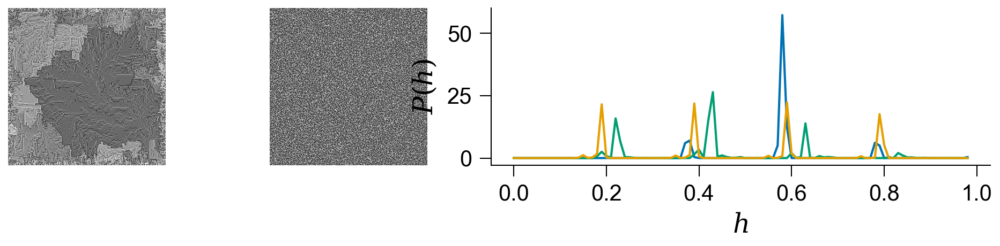

In [12]:
import warnings
from matplotlib.ticker import FixedLocator, NullLocator
from mpl_toolkits.axisartist.axislines import SubplotZero

warnings.resetwarnings()

L1 = 256
L2 = 256

max_nbtry = 6554

warnings.filterwarnings("error")
with plt.style.context(spstyle.get_style('thesis')):
    fig = plt.figure(figsize=(8.2, 2.8))
    gs1 = gridspec.GridSpec(2, 4, wspace = 0.1)
    
    
    ax1 = fig.add_subplot(gs1[0, 0])
    ax2 = fig.add_subplot(gs1[0, 1])
    ax3 = fig.add_subplot(gs1[0, 2:])
    
    
    ######Snapshots and distrib######
    sys1 = np.loadtxt("/data1/DATA_Duplat/Brut/PDF/PD5n10/Snapshots/nav100000000000_outputB.txt").reshape(L1, L2).T
    sys2 = np.loadtxt("/data1/DATA_Duplat/Brut/Rdtopple/Rd8n7/Snapshots/nav100000000000_outputB.txt").reshape(L1, L2).T
    
    nbins = 100
    sys1_filtered = sys1[100:210,90:200]
    sys1_filtered2 = sys1[20:75,20:75]
    
    histo1, bins1 = np.histogram(sys1_filtered, bins = np.arange(0,1,1/nbins), density=True)
    histo2, bins2 = np.histogram(sys1_filtered2, bins = np.arange(0,1,1/nbins), density=True)
    histo3, bins3 = np.histogram(sys2, bins = np.arange(0,1,1/nbins), density=True)
    
    
    ax1.imshow(sys1, cmap = "binary", vmin = 0, vmax = 1)
    ax2.imshow(sys2, cmap = "binary", vmin = 0, vmax = 1)
    ax3.plot(bins1[:-1], histo1, c = color_list[0])
    ax3.plot(bins2[:-1], histo2, c = color_list[1])
    ax3.plot(bins3[:-1], histo3, c = color_list[2])
    
    ax1.set_axis_off()
    ax2.set_axis_off()
    ax3.set_xlabel(r"$h$")
    ax3.set_ylabel(r"$P(h)$")
    

    
    fig.patch.set_alpha(0.0)
    ax1.patch.set_alpha(0.0)
    ax3.patch.set_alpha(0.0)
    fig.savefig('Fig9.pdf', bbox_inches = 'tight', dpi = 600)
    plt.show() 
    
warnings.resetwarnings()

# Fractal dimension

In [ ]:
""" fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]

L1 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[0]
L2 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[1] """

results_s = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                    for  folder in folderpath)

Thisto_s, Tbins_s, Tnonzero_s, Tmean_s,Tnbins_s = zip(*results_s)

In [29]:
NCURVES = len(Tvar)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

Tstart_x = [2,2,1,4,1,0,1,3,5,4,4,8,8,8]
Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]
Txfit_s, Tyfit_s, Ttau_s, Tperr_s = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)

0.96545763582405
0.9950241316250408
0.9530005918190074
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362


/tmp/ipykernel_725217/1008722442.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


In [30]:
results_t= Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histotop.txt".format(folder))
                                                                    for  folder in folderpath)

Thisto_t, Tbins_t, Tnonzero_t, Tmean_t,Tnbins_t  = zip(*results_t)

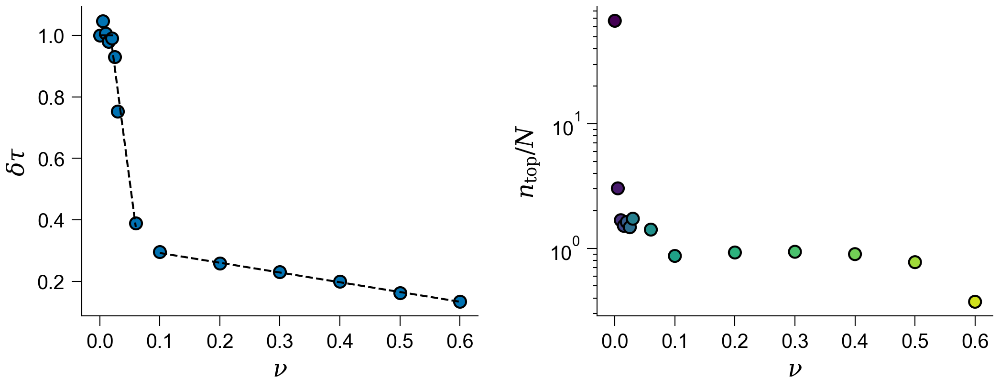

In [31]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax1,ax2) =  plt.subplots(1,2, figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)


    Ttau_bis = np.array((-Ttau_s[0]-1)/(-Ttau_s -1), dtype = float)
    mask1 = slice(4,8)
    mask2 = slice(8, 15)
    mask3 = slice(0,5)

    a, b = np.polyfit(Tvar[mask1], Ttau_bis[mask1],1)
    y1 = a * np.array(Tvar[mask1]) + b
    a2, b2 = np.polyfit(Tvar[9:], Ttau_bis[9:],1)
    y2 = a2 * np.array(Tvar[mask2]) + b2
    
    a3 = 0 
    b3 = 1
    y3 = a3 * np.array(Tvar[mask3]) + b3
    
    ax1.scatter(Tvar, Ttau_bis, c = color_list[0], zorder=2, marker = 'o')
    ax1.plot(Tvar[mask1], y1, ls = '--', c = 'k', label = r'$\delta d$')
    ax1.plot(Tvar[mask2], y2, ls = '--', c = 'k')
    ax1.plot(Tvar[mask3], y3, ls = '-', c = 'k')
    
    ax2.scatter(Tvar, np.array(Tnonzero_t)/(L1 * L2), c = colors)
    
    
    ax1.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6])
    ax1.set_xlabel(r"$\nu$")
    ax1.set_ylabel(r"$\delta \tau$")
    
    ax2.set_yscale('log')
    ax2.set_xlabel(r"$\nu$")
    ax2.set_ylabel(r"$n_\mathrm{top}/N$")
    
    ax2.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6])


    plt.savefig("Fig10.pdf", dpi = 600)
    plt.show()


#   Spatial clustering

In [5]:
L1 = 256
L2 = 256

Tfilepath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}/Avalanche_outputB.gz".format(n) for n in np.arange(1,15)]
for i in range(6):
    Tfilepath[i] = "/data1/DATA_Duplat/Brut/PDF/PD7n{}/Avalanche_outputB.gz".format(i+1)
    
Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}/".format(n) for n in np.arange(1,15)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]

In [6]:
avg_distance = np.zeros(len(Tnu))
for i, file in enumerate(Tfilepath):
    
    if Tnu[i] == 0:
        data = read_gz_with_pandas_nrows(file, nrows=int(1e7), skiprows=0, cols=[2])
    else:
        data = read_gz_with_pandas_nrows(file, nrows=int(1e7), skiprows=int(5e7), cols=[2])
        
        
    y, x = np.unravel_index(data, (L1,L2))

    x = x[:,0]
    y = y[:,0]
    
    diff_x = np.diff(x)
    diff_y = np.diff(y)
    r = np.sqrt(diff_x**2 + diff_y**2)
    avg_distance[i] = np.mean(r)

In [7]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD12n{}/".format(n) for n in np.arange(1,15)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]

r = 1
y, x = np.ogrid[-r:r+1, -r:r+1] # Créé une grille mais pas en matrice, directement en coordonnée
kernel = x**2 + y**2 <= r**2 # Fait un masque des coo contenu dans le cercle de rayon r 

In [8]:
nrows = 10000
nbfolder = 14
mean_dt = np.zeros(nbfolder)
L1 = 256
L2 = 256
for j in range (1,nbfolder):
    file = "/data1/DATA_Duplat/Brut/PDF/PD12n{}/Avalanche_outputB.gz".format(j)
    
    data = read_gz_with_pandas_nrows(file, nrows, skiprows=1, cols=[2,3])
    nin = np.array(data[:,0], dtype = int)
    dz = data[:,1]
    z = np.cumsum(dz)
    
    y, x = np.unravel_index(nin, (L1,L2))
    
    sys = np.zeros((L1, L2), dtype = float)

    sys[x[0], y[0]] = 1
    dt = np.zeros(nrows)
    for i, (xp, yp) in enumerate(zip(x[1:], y[1:])):
        x_min = max(xp - r, 0)
        x_max = min(xp + r+1, L1) #Avoid to be outside the system
        y_min = max(yp - r, 0)
        y_max = min(yp + r+1, L2)
        subsys = sys[x_min:x_max, y_min:y_max]
        sub_kernel = kernel[(x_min - (xp - r)):(x_max - (xp - r)),(y_min - (yp - r)):(y_max - (yp - r))]

        if (np.sum(subsys[sub_kernel]) == 0):
            # sys[xp,yp] = i+2    #At i = 0, we start at two since the sys is set to 0 and the first com to 1
            sys[xp,yp] = z[i+1]
        else:
            u_val = np.unique(subsys[sub_kernel])
            max_t = np.max(subsys[sub_kernel])
            for val in u_val:
                if val != 0:
                    sys[sys == val] = z[i+1]
            dt[i+1] = z[i+1] - max_t
            
    # print(dt, np.mean(dt))
    mean_dt[j-1] = np.mean(dt[dt!=0])

AttributeError: 'Axes' object has no attribute 'spine'

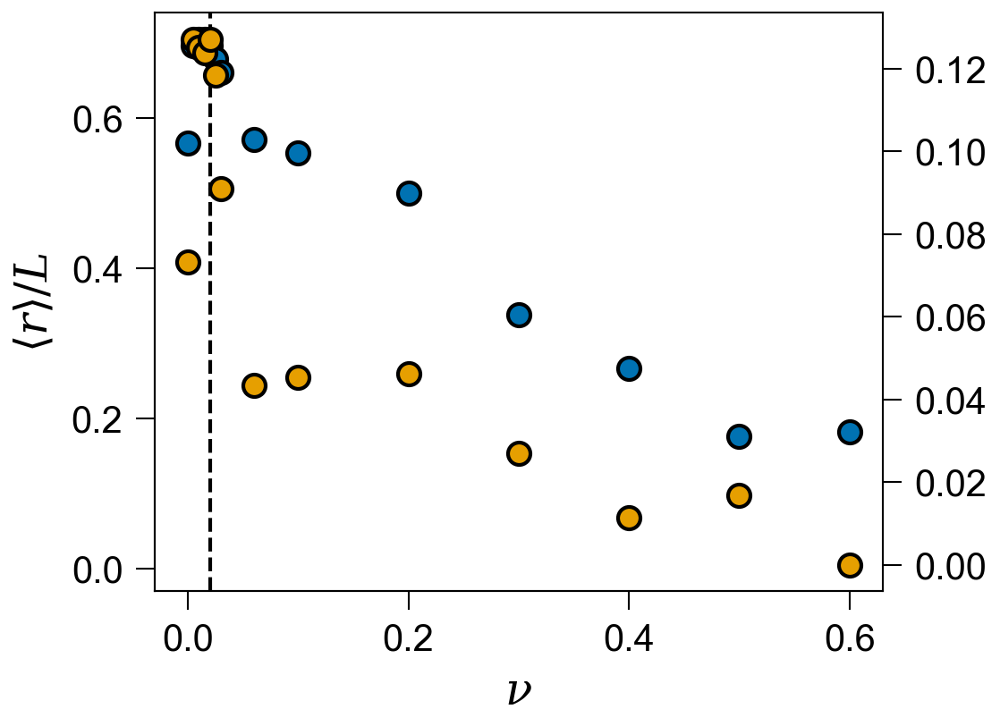

In [9]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(1, 1, figsize = (3.5,2.8))
    ax2 = ax.twinx()
    ax.scatter(Tnu, avg_distance/L1,c = color_list[0])
    ax2.scatter(Tnu, mean_dt, c = color_list[2])
    
    ax.axvline(0.02, ls = '--', c = 'k')
    ax.set_xlabel(r'$\nu$')
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.set_ylim(-0.03,0.74)
    ax.set_ylabel(r'$\langle r \rangle/L$')
    ax.spine['right'].set_color(color_list[0])
    
    ax2.set_ylabel(r"$\langle \delta h_c \rangle$")
    ax2.spine['right'].set_color(color_list[2])
    
    plt.savefig("Spatial2.pdf", dpi = 300)
    plt.show()

/tmp/ipykernel_2036925/3808937753.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/nrows) for i in range(nrows)]


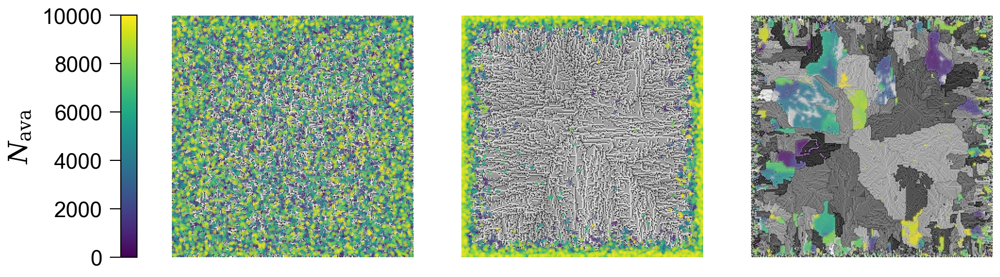

In [ ]:
L1 = 256
L2 = 256

nbfolder = [1,4,14]
Talpha = [0.5,0.5,0.1]
nrows = 10000
colors = [plt.cm.get_cmap('viridis')(i/nrows) for i in range(nrows)]

with plt.style.context(spstyle.get_style('thesis')):
    fig, axis = plt.subplots(1,3, figsize = (7.2,2.8))
    for i, nb in enumerate(nbfolder):
        folderpath = "/data1/DATA_Duplat/Brut/PDF/PD12n{}".format(nb)
        sys1 = np.loadtxt("{}/Snapshots/nav1_outputB.txt".format(folderpath)).reshape(L1, L2)
        
        data = read_gz_with_pandas_nrows("{}/Avalanche_outputB.gz".format(folderpath), nrows, skiprows=1, cols=[2,3])
        nin = np.array(data[:,0], dtype = int)
        dz = data[:,1]
        z = np.cumsum(dz)
        y, x = np.unravel_index(nin, (L1,L2))
        
        
        axis[i].imshow(sys1, cmap = "binary")
        axis[i].scatter(x[:nrows], y[:nrows], color = colors, alpha = Talpha[i], s = 0.5)
        
        axis[i].set_axis_off()
        
    norm = plt.Normalize(0, nrows)
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])

    cbar = plt.colorbar(sm, ax=axis, location = 'left', fraction=0.0185, aspect = 15, pad = 0.04)
    cbar.set_label(r"$N_{\mathrm{ava}}$")
    plt.savefig("Spatial1.pdf", dpi = 300)
    plt.show()

/tmp/ipykernel_1031912/1470364150.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/nrows) for i in range(nrows)]


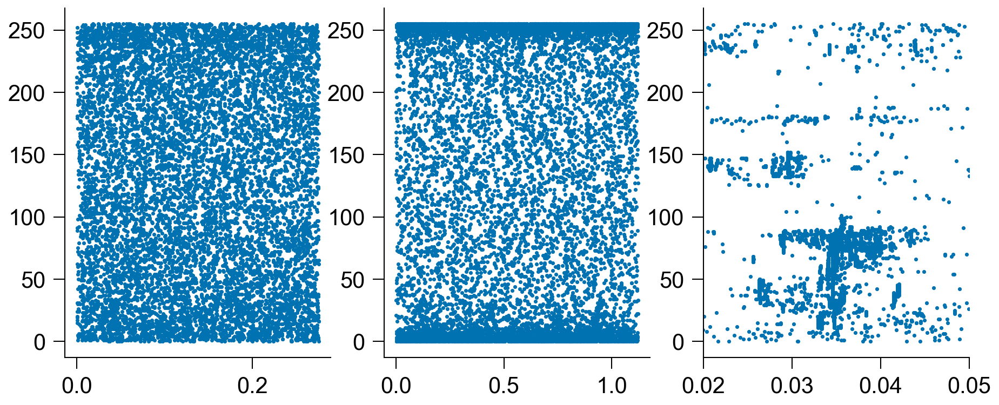

In [12]:
L1 = 256
L2 = 256

nbfolder = [1,4,14]
Talpha = [0.5,0.5,0.1]
nrows = 10000
colors = [plt.cm.get_cmap('viridis')(i/nrows) for i in range(nrows)]

with plt.style.context(spstyle.get_style('thesis')):
    fig, axis = plt.subplots(1,3, figsize = (7.2,2.8))
    for i, nb in enumerate(nbfolder):
        folderpath = "/data1/DATA_Duplat/Brut/PDF/PD12n{}".format(nb)
        sys1 = np.loadtxt("{}/Snapshots/nav1_outputB.txt".format(folderpath)).reshape(L1, L2)
        
        data = read_gz_with_pandas_nrows("{}/Avalanche_outputB.gz".format(folderpath), nrows, skiprows=1, cols=[2,3])
        nin = np.array(data[:,0], dtype = int)
        dz = data[:,1]
        z = np.cumsum(dz)
        y, x = np.unravel_index(nin, (L1,L2))

        
        axis[i].scatter(z[:10000], x[:10000], color = color_list[0], alpha = 1, s = 0.5)
        
        
    # norm = plt.Normalize(0, nrows)
    # sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    # sm.set_array([])

    # cbar = plt.colorbar(sm, ax=axis, location = 'left', fraction=0.0185, aspect = 15, pad = 0.04)
    # cbar.set_label(r"$N_{\mathrm{ava}}$")
    # plt.savefig("Spatial1.pdf", dpi = 300)
    plt.show()

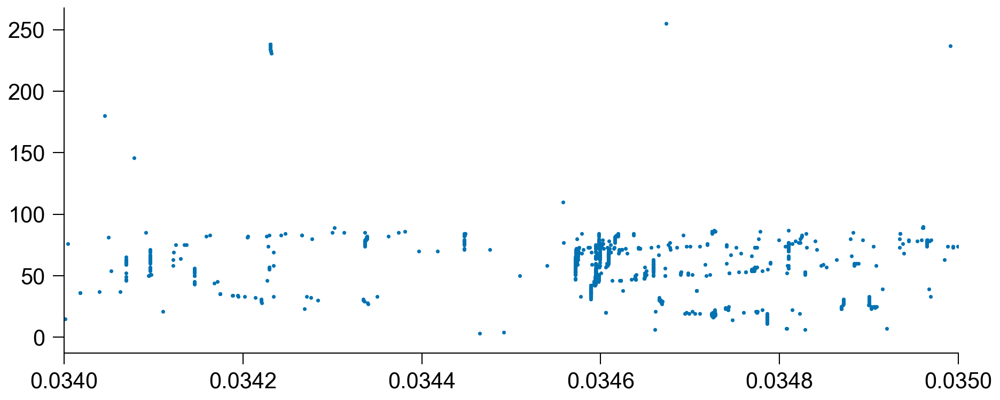

In [46]:
L1 = 256
L2 = 256

nbfolder = [14]

with plt.style.context(spstyle.get_style('thesis')):
    fig, axis = plt.subplots(1,1, figsize = (7.2,2.8))
    for i, nb in enumerate(nbfolder):
        folderpath = "/data1/DATA_Duplat/Brut/PDF/PD12n{}".format(nb)
        
        data = read_gz_with_pandas_nrows("{}/Avalanche_outputB.gz".format(folderpath), nrows, skiprows=1, cols=[1,2,3])
        s = np.array(data[:,0], dtype = int)
        nin = np.array(data[:,1], dtype = int)
        dz = data[:,2]
        z = np.cumsum(dz)
        y, x = np.unravel_index(nin, (L1,L2))

        axis.scatter(z[:10000], x[:10000], color = color_list[0], alpha = 1, s = 0.5)
        
        
    # norm = plt.Normalize(0, nrows)
    # sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    # sm.set_array([])

    # cbar = plt.colorbar(sm, ax=axis, location = 'left', fraction=0.0185, aspect = 15, pad = 0.04)
    # cbar.set_label(r"$N_{\mathrm{ava}}$")
    # plt.savefig("Spatial1.pdf", dpi = 300)
    axis.set_xlim(0.034,0.035)
    plt.show()

#   Distance to criticality

In [33]:
data1 = read_gz_with_pandas_nrows("/data1/DATA_Duplat/Brut/Memory_effects/Me83n9/random_random.gz", cols= [0,4,12], nrows = 500, skiprows = 26000)

sc_diss = data1[:,2]
s_diss = data1[:,1]
Nava_diss = data1[:,0]


data2 = read_gz_with_pandas_nrows("/data1/DATA_Duplat/Brut/Memory_effects/Me77n9/random_random.gz", cols= [0,4,12], nrows = 500)
sc_cons = data2[:,2]
s_cons = data2[:,1]
Nava_cons = data2[:,0]

In [34]:
N = 128**2
mask1 = s_diss >= N/4
mask2 = s_cons >= N/4

In [35]:
def count_lines_gz_safe(filename, csize = 1000):
    count = 0
    chunk_size = csize 
    try:
        with gzip.open(filename, 'rb') as f:
            leftover = b''
            while True:
                chunk = f.read(chunk_size)
                if not chunk:
                    break
                lines = (leftover + chunk).split(b'\n')
                leftover = lines.pop()  # dernière ligne peut être tronquée
                count += len(lines)
            if leftover:
                count += 1  # compte la dernière ligne même si tronquée
    except EOFError:
        # fichier tronqué, on arrête là et on retourne le compte
        pass
    return count

def process_parallel_load(foldernb, nb = [1,2,3,4,5,6,7,8,9], chunksize = 1e6, L = 64, limdata = 1e6, cols = [12], nbins = 50):

    # logbins_s = np.logspace(np.log(1), np.log(L**2), nbins)
    # histo_s = np.zeros(len(logbins_s)-1)
    bins_s = np.arange(0, L**2)
    histo_s = np.zeros(len(bins_s)-1)
    
    logbins_a = np.logspace(np.log(1/L**2), np.log(1), nbins)
    histo_a = np.zeros(len(logbins_a)-1)
    for i in nb:
        file = "/data1/DATA_Duplat/Brut/Memory_effects/Me{}n{}/random_random.gz".format(foldernb,i)
        if chunksize >= 1e5:
            nblines = 0
            
            for chunk in chunked_file_reader(file, chunksize = chunksize, usecols=cols):
                # histo_s += np.histogram(chunk.iloc[:, 0], bins = logbins_s)[0]
                histo_s += np.histogram(chunk.iloc[:, 0], bins = bins_s)[0]
                histo_a += np.histogram(1/chunk.iloc[:, 0], bins = logbins_a)[0]
                
                nblines += len(chunk)
            
                if nblines >= limdata:
                    break
                
        if chunksize < 1e5:
            with gzip.open(file, "rt") as f:
                for i, line in enumerate(f):
                    if line.startswith("#"):
                        continue
                    
                    s= int(float(line.strip().split()[cols[0]]))

                    # id = np.searchsorted(logbins_s, s, side='right') -1
                    # histo_s[id] += 1
                    histo_s[s] +=1
                    
                    id = np.searchsorted(logbins_a, 1/s, side='left') - 1
                    histo_a[id] += 1
                    
                    if i >= limdata:
                        break
        
    logbins_s, loghisto_s = new_logbins(histo_s, nbins)
    
    # log_histo, log_bins = loghisto(histo_s)
    # norm_histo_s = loghisto_s/((np.diff(logbins_s)) * np.sum(loghisto_s))
    norm_histo_a = histo_a/((np.diff(logbins_a)) * np.sum(histo_a))
    
    # return logbins_s, norm_histo_s, logbins_a, norm_histo_a
    return logbins_s, loghisto_s, logbins_a, norm_histo_a

def floor_sig(x, n=1): #Pour récupére le floor de la valeur
    p = int(np.floor(np.log10(abs(x))))
    fact = 10 ** (p - n + 1)
    return int(np.floor(x / fact) * fact)

def count_lines(Tfolder_nb, nbfolder):
    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        min = 1e10
        print(nb)
        for i in range(1,nbfolder+1):
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = count_lines_gz_safe(file)
            print (nbl)
            if nbl < min:
                min = nbl
        print(min)
        
def full_analysis(Tfolder_nb, nbins = 50, cols = [12], nbfolder = [1,2,3,4,5,6,7,8,9]): #To sum different realisation in the same project
    Tnbline = [None]*len(Tfolder_nb)
    Tnu = [None]*len(Tfolder_nb)
    TL = [None]*len(Tfolder_nb)
    
    f_log_histo = []
    f_bin_centers_s = []
    f_bin_centers_a = []
    f_norm_histo_a = []

    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        Tnu[j] = read_parameters("{}n1".format(project))[2]
        TL[j] = read_parameters("{}n1".format(project))[0]
        
        min = 1e10
        for i in nbfolder:
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = floor_sig(count_lines_gz_safe(file), 2)
            if nbl < min:
                min = nbl
        print(min)
        Tnbline[j] = min
        
    results = Parallel(n_jobs=-1)(delayed(process_parallel_load)(nb, nbfolder, nbline/10, L, nbline, cols = cols, nbins = nbins)
                                    for (nb, L, nbline) in zip(Tfolder_nb, TL, Tnbline))
    
    for i, (bins_s, histo_s, bins_a, hist_a) in enumerate(results):
        
        bin_centers_s = (bins_s[:-1] + bins_s[1:])/2
        bin_centers_a = (bins_a[:-1] + bins_a[1:])/2
    
        mask = histo_s !=0
        f_bin_centers_s.append(bin_centers_s[mask])
        f_log_histo.append(histo_s[mask])
    
        mask = hist_a!=0
        f_bin_centers_a.append(bin_centers_a[mask])
        f_norm_histo_a.append(hist_a[mask])
    
    return f_bin_centers_s, f_log_histo, f_bin_centers_a,f_norm_histo_a
    
def gamma_th():

    fnb = np.arange(1,15)
    folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
    """ folderpath = np.insert(folderpath, 8, '/data1/DATA_Duplat/Brut/PDF/PD8n1') """
    Tvar = [read_parameters(folder)[2] for folder in folderpath]

    results = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                        for  folder in folderpath)
    Thisto_s, Tbins_s, _, _, _ = zip(*results)

    Tstart_x = [2,4,4,4,1,0,1,3,5,4,4,8,8,8]
    Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]
    _, _, Ttau_s, _ = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)
    
    gamma = (-Ttau_s) - (-Ttau_s[0]) - 1
    
    return Tvar, gamma, -Ttau_s
    

def log_exppowlaw(x, a, b, c):
    return np.log(a)-b*np.log(x)-x/c


In [36]:
Tfolder_nb = [77,78,79,80,81,83, 82]
Tbin_s1, Thisto_s1, Tbin_a1, Thisto_a1 = full_analysis(Tfolder_nb, nbfolder = [2,3,4,5,6,7,8,9], nbins = 70, cols =[12])

36000
360000
390000
380000
360000
290000
340000


/tmp/ipykernel_725217/2605111436.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


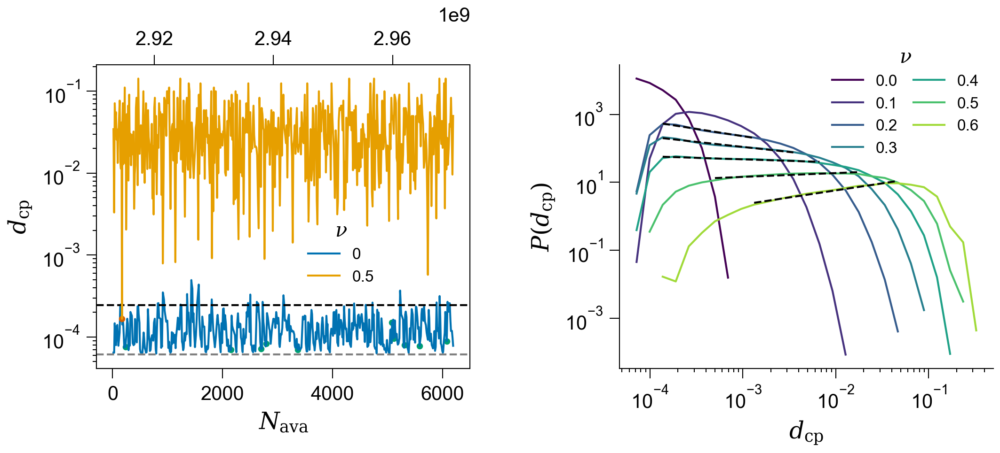

In [46]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax, ax3) = plt.subplots(1,2,figsize = (8.2,2.8))
    fig.subplots_adjust(wspace = 0.4)
    
    
    # mask3 = ((1/np.array(sc_diss) >= 1/2e3) &  (1/np.array(sc_diss) <= 1/40))
    
    ax2 = ax.twiny()
    leg1 = ax.plot(Nava_cons, 1/sc_cons, c = color_list[0], label = 0)
    ax.scatter(Nava_cons[mask2], 1/sc_cons[mask2], color = color_list[1], s = 5)
    # ax.plot(Nava_cons, 1/s_cons, c = color_list[1], label = 0)
    leg2 = ax2.plot(Nava_diss, 1/sc_diss, c = color_list[2], label = 0.5)
    ax2.scatter(Nava_diss[mask1], 1/sc_diss[mask1], color = color_list[3], s = 5)
    # ax2.plot(Nava_diss, 1/s_diss, c = color_list[3], label = 0)
    
    Tstart = [1/1e4, 1/2e4, 1/1e4, 1/1e4, 1/1e4, 1/2e3, 1/1e3]
    Tstop = [1/1000, 1/1e3, 1/400, 1/200, 1/100, 1/40, 1/15]
    
    Tnu = [0.0, 0.1, 0.2, 0.3 ,0.4, 0.5, 0.6]
    Tgamma_dcp = [None]*len(Tnu)
    Tperr = [None]*len(Tnu)
    NCURVES = len(Tnu)
    Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
    
    for j, n in enumerate(Tnu):
        ax3.plot(Tbin_a1[j], Thisto_a1[j], c = Tcolor[j], label = f"{Tnu[j]}")
        
        if j not in [0, 1]:
            start = np.where(Tbin_a1[j] >= Tstart[j])[0][0]
            stop = np.where(Tbin_a1[j] <= Tstop[j])[0][-1]
            popt, pcov = curve_fit(powerlaw2, np.log(Tbin_a1[j][start:stop]), np.log(Thisto_a1[j][start:stop]), p0 = [0.5, 1.6], maxfev = 1000)
            Tperr[j] = np.sqrt(np.diag(pcov))[1]
            Tgamma_dcp[j] = popt[1]
            yfit = np.exp(powerlaw2(np.log(Tbin_a1[j][start:stop]), *popt))
            ax3.plot(Tbin_a1[j][start:stop], yfit, ls = '--', c ='k', lw =1)
    
    ax.axhline(4/N, ls = '--', c = 'k')
    ax.axhline(1/N, ls = '--', c = 'gray')
    ax.set_xlabel(r"$N_{\mathrm{ava}}$")
    ax.set_ylabel(r"$d_\mathrm{cp}$")
    ax.set_yscale("log")
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.legend(title = r"$\nu$", handles = [leg1[0],leg2[0]], bbox_to_anchor=(0.78, 0.23))
    
    ax3.set_xlabel(r"$d_\mathrm{cp}$")
    ax3.set_ylabel(r"$P(d_\mathrm{cp})$")
    ax3.set_xscale('log')
    ax3.set_yscale('log')
    ax3.legend(ncols = 2, loc = "upper right", columnspacing=1.0, title = r"$\nu$", bbox_to_anchor = (1,1.1))
    
    plt.savefig("s_c(t).pdf", dpi = 300)
    plt.show()

In [8]:
print(Tgamma_dcp)
print(Tphi)

print(-np.array(Tphi[2:]) - np.array(Tgamma_dcp[2:]))

[None, None, -0.4299180566003083, -0.2983311067755627, -0.08867248774144738, 0.11259010825134036, 0.4158316505093642]


NameError: name 'Tphi' is not defined